In [1]:
import numpy as np
import xarray as xr

import tqdm
import os

import matplotlib.pyplot as plt
import cmocean as cm

from importlib import reload
import Lagrangian_model as Lm
reload(Lm)

<module 'Lagrangian_model' from '/storage/home/4302001/backtracking_play/channel/Lagrangian_model.py'>

In [2]:
input_dir = "/nethome/4302001/local_data/channel/"

In [3]:
ds = xr.open_dataset(input_dir + "ACC_ridge_fine_2y_loca.nc")
ds_derivatives = xr.open_dataset(input_dir + "ACC_ridge_fine_2y_derivatives_1y.nc")
ds_derivatives_avg = xr.open_dataset(input_dir + "ACC_ridge_fine_2y_derivatives_tave_1y.nc")
ds_energy = xr.open_dataset(input_dir + "ACC_ridge_fine_2y_energy_1y.nc")

ds_surface = ds.isel(Z=0)
ds_surface = ds_surface.drop(["THETA", "SALT", "TRELAX", "MXLDEPTH", "ETAN", "WVEL"] + [coord for coord in ds_surface.coords if coord not in ["XC", "XG", "YC", "YG", "time", "iter"]]).load()
# ds_surface = xr.open_dataset("/Users/4302001/Downloads/ACC_ridge_fine_2y_surface.nc")
ds_surface_shot = ds_surface.isel(time=0)
ds_3d_shot = ds.isel(time=0)

In [4]:
def plot_trajectories(ds, T=None, return_fig=False, title=None, tile=(0, 2), howmany=1000, figsize=(4, 4)):

    np.random.seed(42)
    rng = np.random.default_rng()
    rantraj = rng.choice(ds.trajectory, size=howmany, replace=False)

    X = ds.isel(trajectory=rantraj).X
    Y = ds.isel(trajectory=rantraj).Y
    T = ds.T
  
    n_parts = X.shape[1]

    if type(T) is int:
        time_extent = T
    else:
        time_extent = np.abs(T[0] - T[-1]) / 24/60/60

    if tile:
        fig, ax = plt.subplots(figsize=((figsize[0]-0.5)*(tile[1]-tile[0]), figsize[1])) # figsize=((figsize[0]-0.5)*(tile[1]-tile[0]), figsize[1])
    else:
        fig, ax = plt.subplots(figsize=figsize)
    ax.set_aspect("equal")
    if tile:
        ax.set_xlim(tile[0]*1000, tile[1]*1000)
        for i in range(tile[0], tile[1] + 1):
            plt.axvline(i * 1000, color="black", linestyle='--', linewidth=0.5)
    else:
        ax.set_xlim(0, 1000)
    ax.set_ylim(0, 2000)
    ax.set_xlabel("x (km)")
    ax.set_ylabel("y (km)")

    for i in range(n_parts):
        plt.plot(X[:, i] / 1000, Y[:, i] / 1000, linewidth=0.5, alpha=1)
    
    ax.set_title(title)

    fig.tight_layout()

    if return_fig:
        return fig, ax
    else:
        plt.show()

In [5]:
UVEL_values = ds_surface.UVEL.values
VVEL_values = ds_surface.VVEL.values

def compute_distance(pset_1, pset_2, signs=(1, 1)):
    # mask = np.isfinite(pset_1.X[-1, :]) * np.isfinite(pset_2.X[-1, :])
    # dist = np.sqrt((pset_1.X[::signs[0], mask] - pset_2.X[::signs[1], mask])**2 + (pset_1.Y[::signs[0], mask] - pset_2.Y[::signs[1], mask])**2)
    dist = np.sqrt((pset_1.X[::signs[0], :] - pset_2.X[::signs[1], :])**2 + (pset_1.Y[::signs[0], :] - pset_2.Y[::signs[1], :])**2)
    
    return dist

def plot_distance(dist, T = 180 * 24 * 60 * 60, label=None):
    fig, ax = plt.subplots()
    if type(T) != np.ndarray:
        T = np.linspace(0, T, dist.shape[0])
    diff = ax.pcolormesh(T / 24 / 60 / 60, np.arange(dist.shape[-1]), dist.T, vmax=1e6)
    ax.set_xlabel("Time (days)")
    ax.set_ylabel("Particle #")
    fig.colorbar(diff, label="Distance (m)")
    ax.set_title(label)
    fig.tight_layout()

# Load in data

In [6]:
trajdir = "/nethome/4302001/output_data/backtracking/channel/"

In [7]:
res = {}
with os.scandir(trajdir) as entries:
    for entry in tqdm.tqdm(entries):
        if entry.is_file():
            res[entry.name[:-3]] = xr.open_dataset(entry.path).load().set_coords('T')
            res[entry.name[:-3]]['T_day'] = res[entry.name[:-3]].T / 86400
            res[entry.name[:-3]] = res[entry.name[:-3]].set_coords('T_day')


52it [02:50,  3.29s/it]


In [8]:
for key in res.keys():
    print(key)

anal_2D_dynamic_backw
anal_3D_static_z10
anal_3D_static_z300
anal_3D_static_z300_backw
anal_2D_dynamic_dt1h_backw
anal_2D_dynamic_dt6h_backw
anal_2D_dynamic_backw_perturbed_100m
anal_2D_dynamic_backw_perturbed_1m
anal_2D_dynamic_backw_perturbed_1cm
anal_2D_dynamic_dt1m
rk4_2D_dyn_dt1h
rk4_2D_dyn_dt6h
rk4_2D_dyn_dt6h_backw
rk4_2D_dyn_dt1m_backw
anal_2D_dynamic_dt1d_backw
anal_2D_static_backw_from_t0
anal_static_forward_from_backw_from_t0
RK4_2D_static_dt10_180d
RK4_2D_static_dt10_180d_backw
RK4_2D_static_dt10_180d_backw_from_t0
RK4_2D_static_dt10_forward_from_backw_from_t0
RK4_2D_dyn_dt10_180d
RK4_2D_dyn_dt10_180d_backw
RK4_2D_dyn_dt10_180d_backw_from_t0
RK4_2D_dyn_dt10_forward_from_backw_from_t0
RK4_3D_static_dt10_z10
RK4_3D_static_dt10_z10_backw
RK4_3D_static_dt10_z300
RK4_3D_static_dt10_z300_backw
RK4_3D_dynamic_dt10_z10
RK4_3D_dynamic_dt10_z10_backw
RK4_3D_dynamic_dt10_z300
RK4_3D_dynamic_dt10_z300_backw
anal_2D_static
anal_2D_static_backw
anal_2D_static_using_dyn
anal_2D_dynamic
RK

In [9]:
qc_runs = []
for key in res.keys():
    if key[-6:] == "_backw":
        assert key[:-6] in res.keys()
        print(f"Comparing {key} with its forward run")
        nanmask = np.isfinite(res[key].X[0])
        if not (res[key].X[0][nanmask] == res[key[:-6]].X[-1][nanmask]).all():
            print("THESE DONT MATCH")
        else:
            qc_runs.append(key[:-6])

Comparing anal_2D_dynamic_backw with its forward run
Comparing anal_3D_static_z300_backw with its forward run
Comparing anal_2D_dynamic_dt1h_backw with its forward run
Comparing anal_2D_dynamic_dt6h_backw with its forward run
Comparing rk4_2D_dyn_dt6h_backw with its forward run
Comparing rk4_2D_dyn_dt1m_backw with its forward run
Comparing anal_2D_dynamic_dt1d_backw with its forward run
Comparing RK4_2D_static_dt10_180d_backw with its forward run
Comparing RK4_2D_dyn_dt10_180d_backw with its forward run
Comparing RK4_3D_static_dt10_z10_backw with its forward run
Comparing RK4_3D_static_dt10_z300_backw with its forward run
Comparing RK4_3D_dynamic_dt10_z10_backw with its forward run
Comparing RK4_3D_dynamic_dt10_z300_backw with its forward run
Comparing anal_2D_static_backw with its forward run
Comparing anal_3D_static_z10_backw with its forward run
Comparing anal_3D_dynamic_z10_backw with its forward run
Comparing anal_3D_dynamic_z300_backw with its forward run
Comparing rk4_2D_dyn_dt1

In [10]:
qc_runs

['anal_2D_dynamic',
 'anal_3D_static_z300',
 'anal_2D_dynamic_dt1h',
 'anal_2D_dynamic_dt6h',
 'rk4_2D_dyn_dt6h',
 'rk4_2D_dyn_dt1m',
 'anal_2D_dynamic_dt1d',
 'RK4_2D_static_dt10_180d',
 'RK4_2D_dyn_dt10_180d',
 'RK4_3D_static_dt10_z10',
 'RK4_3D_static_dt10_z300',
 'RK4_3D_dynamic_dt10_z10',
 'RK4_3D_dynamic_dt10_z300',
 'anal_2D_static',
 'anal_3D_static_z10',
 'anal_3D_dynamic_z10',
 'anal_3D_dynamic_z300',
 'rk4_2D_dyn_dt1h',
 'anal_2D_dynamic_dt1m']

In [11]:
pretty_names = {}

for name in qc_runs:
    parts = name.split('_')
    prettified_name = ""
    
    if 'RK4' in parts:
        prettified_name += "RK4 "
    elif 'anal' in parts:
        prettified_name += "Analytical "
    
    if '2D' in parts:
        prettified_name += "2D "
    elif '3D' in parts:
        prettified_name += "3D "
    
    if 'static' in parts:
        prettified_name += "stationary"
    elif 'dyn' in parts or 'dynamic' in parts:
        prettified_name += "dynamic"
    
    for part in parts:
        if 'dt' in part:
            dt_value = part.replace('dt', '')
            prettified_name += f"\ndt = {dt_value} min"
    
    for part in parts:
        if 'z' in part:
            z_value = part.replace('z', '')
            prettified_name += ", "
            if prettified_name[-3:] != 'min':
                prettified_name += "\n"
            prettified_name += f"z = {z_value} m"
    
    pretty_names[name] = prettified_name.strip()


# Analysis of speed over time

In [13]:
speed = ds_surface.UVEL

In [14]:
ds_surface.isel(time=0)

<xarray.Dataset>
Dimensions:  (XC: 200, YC: 400, XG: 200, YG: 400)
Coordinates:
  * XC       (XC) float32 2.5e+03 7.5e+03 1.25e+04 ... 9.925e+05 9.975e+05
  * YC       (YC) float32 2.5e+03 7.5e+03 1.25e+04 ... 1.992e+06 1.998e+06
  * XG       (XG) float32 0.0 5e+03 1e+04 1.5e+04 ... 9.85e+05 9.9e+05 9.95e+05
  * YG       (YG) float32 0.0 5e+03 1e+04 ... 1.985e+06 1.99e+06 1.995e+06
    iter     int64 346
    time     object 2000-01-02 00:01:40
Data variables:
    VVEL     (YG, XC) float32 0.0 0.0 0.0 0.0 ... -0.008109 -0.007309 -0.006844
    UVEL     (YC, XG) float32 0.0 0.0 0.0 0.0 ... -0.02524 -0.03063 -0.03514

In [15]:
def post_interpolate_speed_2d(ds_field, pset, mode='stationary'):
    X = pset.X.values
    Y = pset.Y.values
    if mode == 'stationary':
        print("Assuming stationary field")
        U_interp, V_interp = Lm.UV_interp_numpy(ds_field.isel(time=0).UVEL.values, ds_field.isel(time=0).VVEL.values, X.flatten(), Y.flatten())
        U_interp = U_interp.reshape(X.shape)
        V_interp = V_interp.reshape(Y.shape)
    else:
        print("Assuming dynamic field")
        assert np.all(pset.T % 86400 == 0), "Can only interpolate at output of ds_field for now"
        assert np.all(pset.T >= 0), "Nonnegative timestamps not allowed"
        U_interp = np.zeros_like(X) * np.nan
        V_interp = np.zeros_like(Y) * np.nan
        T_steps = X.shape[0]
        for tidx, T in tqdm.tqdm(enumerate(pset.T.values)):
            field_tidx = int(T // 86400)
            U_interp_step, V_interp_step = Lm.UV_interp_numpy(ds_field.isel(time=field_tidx).UVEL.values, ds_field.isel(time=field_tidx).VVEL.values, X[tidx], Y[tidx])
            U_interp[tidx, :] = U_interp_step
            V_interp[tidx, :] = V_interp_step

    speed = np.sqrt(U_interp**2 + V_interp**2)
    ds_speed = xr.DataArray(data=speed, coords=pset.coords, dims=pset.dims, name='speed')
    return ds_speed

In [16]:
res['RK4_2D_static_dt10_180d']['speed'] = post_interpolate_speed_2d(ds_surface, res['RK4_2D_static_dt10_180d'])
res['RK4_2D_static_dt10_180d_backw']['speed'] = post_interpolate_speed_2d(ds_surface, res['RK4_2D_static_dt10_180d_backw'])

Assuming stationary field
Assuming stationary field


In [17]:
res['RK4_2D_static_dt10_180d_backw_from_t0']['speed'] = post_interpolate_speed_2d(ds_surface, res['RK4_2D_static_dt10_180d_backw_from_t0'])
res['RK4_2D_static_dt10_forward_from_backw_from_t0']['speed'] = post_interpolate_speed_2d(ds_surface, res['RK4_2D_static_dt10_forward_from_backw_from_t0'])

Assuming stationary field
Assuming stationary field


In [18]:
res['RK4_2D_dyn_dt10_180d']['speed'] = post_interpolate_speed_2d(ds_surface, res['RK4_2D_dyn_dt10_180d'], mode='dynamic')
res['RK4_2D_dyn_dt10_180d_backw']['speed'] = post_interpolate_speed_2d(ds_surface, res['RK4_2D_dyn_dt10_180d_backw'], mode='dynamic')

Assuming dynamic field


181it [00:01, 124.89it/s]


Assuming dynamic field


181it [00:01, 123.27it/s]


In [19]:

res['RK4_2D_dyn_dt10_180d_backw_from_t0']['speed'] = post_interpolate_speed_2d(ds_surface, res['RK4_2D_dyn_dt10_180d_backw_from_t0'], mode='dynamic')
res['RK4_2D_dyn_dt10_forward_from_backw_from_t0']['speed'] = post_interpolate_speed_2d(ds_surface, res['RK4_2D_dyn_dt10_forward_from_backw_from_t0'], mode='dynamic')


Assuming dynamic field


181it [00:01, 124.88it/s]


Assuming dynamic field


181it [00:01, 123.41it/s]


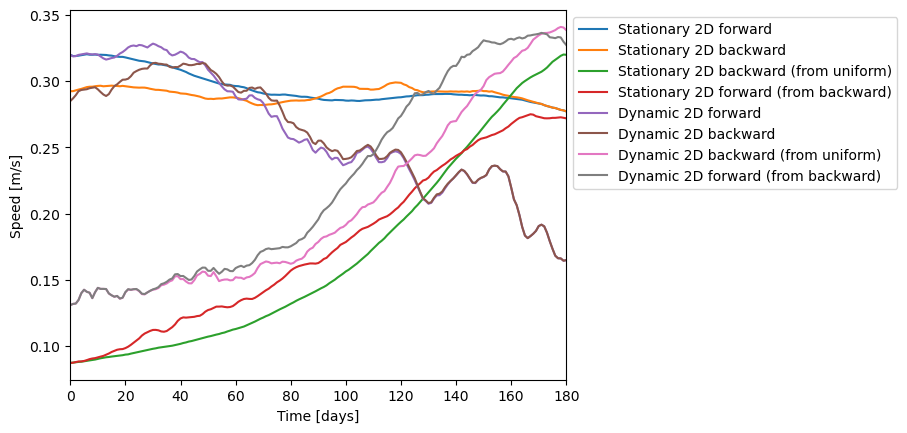

In [20]:
fig, ax = plt.subplots()

res['RK4_2D_static_dt10_180d']['speed'].mean('trajectory').plot(label="Stationary 2D forward")
res['RK4_2D_static_dt10_180d_backw']['speed'].mean('trajectory')[::-1].plot(label="Stationary 2D backward")

res['RK4_2D_static_dt10_180d_backw_from_t0']['speed'].mean('trajectory')[::-1].plot(label="Stationary 2D backward (from uniform)")
res['RK4_2D_static_dt10_forward_from_backw_from_t0']['speed'].mean('trajectory').plot(label="Stationary 2D forward (from backward)")

res['RK4_2D_dyn_dt10_180d']['speed'].mean('trajectory').plot(label="Dynamic 2D forward")
res['RK4_2D_dyn_dt10_180d_backw']['speed'].mean('trajectory')[::-1].plot(label="Dynamic 2D backward")

res['RK4_2D_dyn_dt10_180d_backw_from_t0']['speed'].mean('trajectory')[::-1].plot(label="Dynamic 2D backward (from uniform)")
res['RK4_2D_dyn_dt10_forward_from_backw_from_t0']['speed'].mean('trajectory').plot(label="Dynamic 2D forward (from backward)")


ax.set_xlabel('Time [days]')
ax.set_ylabel('Speed [m/s]')

ax.legend(loc='upper left', bbox_to_anchor=(1, 1))
ax.set_xlim(0, 180)
plt.show()

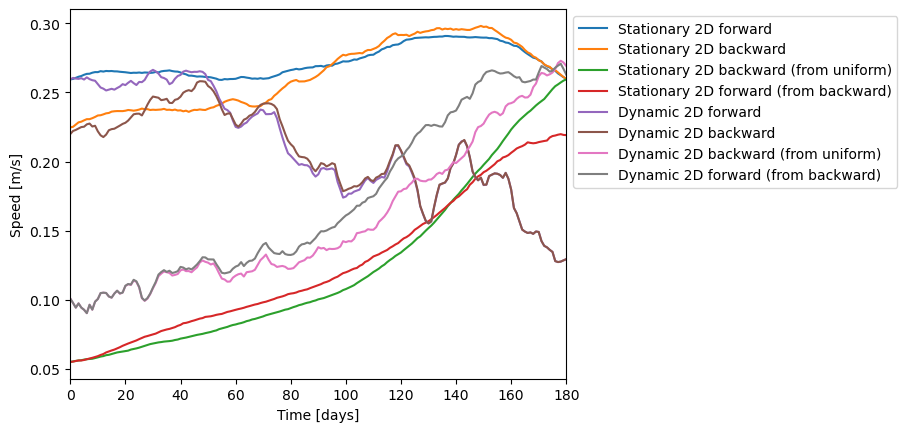

In [21]:
fig, ax = plt.subplots()

res['RK4_2D_static_dt10_180d']['speed'].median('trajectory').plot(label="Stationary 2D forward")
res['RK4_2D_static_dt10_180d_backw']['speed'].median('trajectory')[::-1].plot(label="Stationary 2D backward")

res['RK4_2D_static_dt10_180d_backw_from_t0']['speed'].median('trajectory')[::-1].plot(label="Stationary 2D backward (from uniform)")
res['RK4_2D_static_dt10_forward_from_backw_from_t0']['speed'].median('trajectory').plot(label="Stationary 2D forward (from backward)")

res['RK4_2D_dyn_dt10_180d']['speed'].median('trajectory').plot(label="Dynamic 2D forward")
res['RK4_2D_dyn_dt10_180d_backw']['speed'].median('trajectory')[::-1].plot(label="Dynamic 2D backward")

res['RK4_2D_dyn_dt10_180d_backw_from_t0']['speed'].median('trajectory')[::-1].plot(label="Dynamic 2D backward (from uniform)")
res['RK4_2D_dyn_dt10_forward_from_backw_from_t0']['speed'].median('trajectory').plot(label="Dynamic 2D forward (from backward)")


ax.set_xlabel('Time [days]')
ax.set_ylabel('Speed [m/s]')

ax.legend(loc='upper left', bbox_to_anchor=(1, 1))
ax.set_xlim(0, 180)
plt.show()

# Divergence over time

In [22]:
reload(Lm)

<module 'Lagrangian_model' from '/storage/home/4302001/backtracking_play/channel/Lagrangian_model.py'>

In [23]:
def post_interpolate_tfield(da_field, pset, mode='stationary', how='nearest'):
    """
    Interpolate any tracer at the t-points
    """
    X = pset.X.values
    Y = pset.Y.values

    if how == 'linear':
        interpolator = Lm.T_linear_interp_numpy
    elif how == 'nearest':
        interpolator = Lm.T_nearest_interp_numpy
    else:
        raise ValueError

    if mode == 'stationary':
        print("Assuming stationary field")
        field_interp = interpolator(da_field.values, X.flatten(), Y.flatten())
        field_interp = field_interp.reshape(X.shape)
    else:
        print("Assuming dynamic field")
        assert np.all(pset.T % 86400 == 0), "Can only interpolate at output of ds_field for now"
        assert np.all(pset.T >= 0), "Nonnegative timestamps not allowed"
        field_interp = np.zeros_like(X) * np.nan
        T_steps = X.shape[0]
        for tidx, T in tqdm.tqdm(enumerate(pset.T.values)):
            field_tidx = int(T // 86400)
            field_interp_step = interpolator(da_field.isel(time=field_tidx).values, X[tidx], Y[tidx])
            field_interp[tidx, :] = field_interp_step

    ds_field = xr.DataArray(data=field_interp, coords=pset.coords, dims=pset.dims)
    return ds_field

🚨 The divergence in `ds_divergence` should be divided by $\Delta x = 5000$, because originally only the difference was taken, rather than the derivative. This is now fixed in the code `channel_compute_derivatives`, but here we use an older version of the dataset. Either way, order of magnitudes should be ~4e-6.

In [24]:
surface_divergence = (ds_derivatives.isel(Z=0, time=slice(0, 182)).dUdX/5000 + ds_derivatives.isel(Z=0, time=slice(0, 182)).dVdY/5000).load()

In [25]:
field_interp = Lm.T_nearest_interp_numpy(surface_divergence.isel(time=0).values, res['RK4_2D_static_dt10_180d'].X.values.flatten(), res['RK4_2D_static_dt10_180d'].Y.values.flatten())

In [26]:
reload(Lm)

<module 'Lagrangian_model' from '/storage/home/4302001/backtracking_play/channel/Lagrangian_model.py'>

In [27]:
res['RK4_2D_static_dt10_180d']['divergence'] = post_interpolate_tfield(surface_divergence.isel(time=0), res['RK4_2D_static_dt10_180d'])
res['RK4_2D_static_dt10_180d_backw']['divergence'] = post_interpolate_tfield(surface_divergence.isel(time=0), res['RK4_2D_static_dt10_180d_backw'])

Assuming stationary field
Assuming stationary field


In [28]:
res['anal_2D_static']['divergence'] = post_interpolate_tfield(surface_divergence.isel(time=0), res['anal_2D_static'])
res['anal_2D_static_backw']['divergence'] = post_interpolate_tfield(surface_divergence.isel(time=0), res['anal_2D_static_backw'])

Assuming stationary field
Assuming stationary field


In [29]:
res['RK4_2D_static_dt10_180d_backw_from_t0']['divergence'] = post_interpolate_tfield(surface_divergence.isel(time=0), res['RK4_2D_static_dt10_180d_backw_from_t0'])
res['RK4_2D_static_dt10_forward_from_backw_from_t0']['divergence'] = post_interpolate_tfield(surface_divergence.isel(time=0), res['RK4_2D_static_dt10_forward_from_backw_from_t0'])

Assuming stationary field


Assuming stationary field


In [30]:
res['RK4_2D_dyn_dt10_180d']['divergence'] = post_interpolate_tfield(surface_divergence, res['RK4_2D_dyn_dt10_180d'], mode='dynamic')
res['RK4_2D_dyn_dt10_180d_backw']['divergence'] = post_interpolate_tfield(surface_divergence, res['RK4_2D_dyn_dt10_180d_backw'], mode='dynamic')

Assuming dynamic field


181it [00:00, 452.48it/s]


Assuming dynamic field


181it [00:00, 440.02it/s]


In [31]:
res['anal_2D_dynamic']['divergence'] = post_interpolate_tfield(surface_divergence, res['anal_2D_dynamic'], mode='dynamic')
res['anal_2D_dynamic_backw']['divergence'] = post_interpolate_tfield(surface_divergence, res['anal_2D_dynamic_backw'], mode='dynamic')

Assuming dynamic field


181it [00:00, 454.72it/s]


Assuming dynamic field


181it [00:00, 451.01it/s]


In [32]:
for key in res.keys():
    print(key)

anal_2D_dynamic_backw
anal_3D_static_z10
anal_3D_static_z300
anal_3D_static_z300_backw
anal_2D_dynamic_dt1h_backw
anal_2D_dynamic_dt6h_backw
anal_2D_dynamic_backw_perturbed_100m
anal_2D_dynamic_backw_perturbed_1m
anal_2D_dynamic_backw_perturbed_1cm
anal_2D_dynamic_dt1m
rk4_2D_dyn_dt1h
rk4_2D_dyn_dt6h
rk4_2D_dyn_dt6h_backw
rk4_2D_dyn_dt1m_backw
anal_2D_dynamic_dt1d_backw
anal_2D_static_backw_from_t0
anal_static_forward_from_backw_from_t0
RK4_2D_static_dt10_180d
RK4_2D_static_dt10_180d_backw
RK4_2D_static_dt10_180d_backw_from_t0
RK4_2D_static_dt10_forward_from_backw_from_t0
RK4_2D_dyn_dt10_180d
RK4_2D_dyn_dt10_180d_backw
RK4_2D_dyn_dt10_180d_backw_from_t0
RK4_2D_dyn_dt10_forward_from_backw_from_t0
RK4_3D_static_dt10_z10
RK4_3D_static_dt10_z10_backw
RK4_3D_static_dt10_z300
RK4_3D_static_dt10_z300_backw
RK4_3D_dynamic_dt10_z10
RK4_3D_dynamic_dt10_z10_backw
RK4_3D_dynamic_dt10_z300
RK4_3D_dynamic_dt10_z300_backw
anal_2D_static
anal_2D_static_backw
anal_2D_static_using_dyn
anal_2D_dynamic
RK

In [33]:

res['RK4_2D_dyn_dt10_180d_backw_from_t0']['divergence'] = post_interpolate_tfield(surface_divergence, res['RK4_2D_dyn_dt10_180d_backw_from_t0'], mode='dynamic')
res['RK4_2D_dyn_dt10_forward_from_backw_from_t0']['divergence'] = post_interpolate_tfield(surface_divergence, res['RK4_2D_dyn_dt10_forward_from_backw_from_t0'], mode='dynamic')


Assuming dynamic field


181it [00:00, 448.51it/s]


Assuming dynamic field


181it [00:00, 435.47it/s]


In [34]:
res['anal_3D_dynamic_z10']['divergence'] = post_interpolate_tfield(surface_divergence, res['anal_3D_dynamic_z10'], mode='dynamic')
res['anal_3D_dynamic_z10_backw']['divergence'] = post_interpolate_tfield(surface_divergence, res['anal_3D_dynamic_z10_backw'], mode='dynamic')

Assuming dynamic field


181it [00:00, 448.06it/s]


Assuming dynamic field


181it [00:00, 436.66it/s]


In [35]:
res['RK4_3D_dynamic_dt10_z10']['divergence'] = post_interpolate_tfield(surface_divergence, res['RK4_3D_dynamic_dt10_z10'], mode='dynamic')
res['RK4_3D_dynamic_dt10_z10_backw']['divergence'] = post_interpolate_tfield(surface_divergence, res['RK4_3D_dynamic_dt10_z10_backw'], mode='dynamic')

Assuming dynamic field


181it [00:00, 446.31it/s]


Assuming dynamic field


181it [00:00, 442.10it/s]


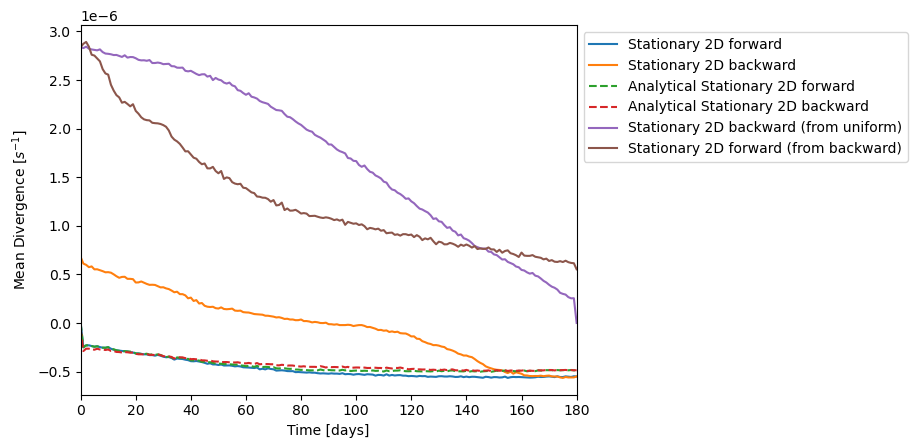

In [36]:
fig, ax = plt.subplots()

res['RK4_2D_static_dt10_180d']['divergence'].mean('trajectory').plot(label="Stationary 2D forward")
res['RK4_2D_static_dt10_180d_backw']['divergence'].mean('trajectory')[::-1].plot(label="Stationary 2D backward")

res['anal_2D_static']['divergence'].mean('trajectory').plot(label="Analytical Stationary 2D forward", linestyle='--')
res['anal_2D_static_backw']['divergence'].mean('trajectory')[::-1].plot(label="Analytical Stationary 2D backward", linestyle='--')


res['RK4_2D_static_dt10_180d_backw_from_t0']['divergence'].mean('trajectory')[::-1].plot(label="Stationary 2D backward (from uniform)")
res['RK4_2D_static_dt10_forward_from_backw_from_t0']['divergence'].mean('trajectory').plot(label="Stationary 2D forward (from backward)")


# res['RK4_2D_dyn_dt10_180d']['divergence'].mean('trajectory').plot(label="Dynamic 2D forward")
# res['RK4_2D_dyn_dt10_180d_backw']['divergence'].mean('trajectory')[::-1].plot(label="Dynamic 2D backward")

# res['RK4_2D_dyn_dt10_180d_backw_from_t0']['divergence'].mean('trajectory')[::-1].plot(label="Dynamic 2D backward (from uniform)")
# res['RK4_2D_dyn_dt10_forward_from_backw_from_t0']['divergence'].mean('trajectory').plot(label="Dynamic 2D forward (from backward)")


ax.set_xlabel('Time [days]')
ax.set_ylabel('Mean Divergence [$s^{-1}$]')

ax.legend(loc='upper left', bbox_to_anchor=(1, 1))
ax.set_xlim(0, 180)
plt.savefig("figures/divergence_comparison_2D_static.pdf", bbox_inches='tight')
plt.show()

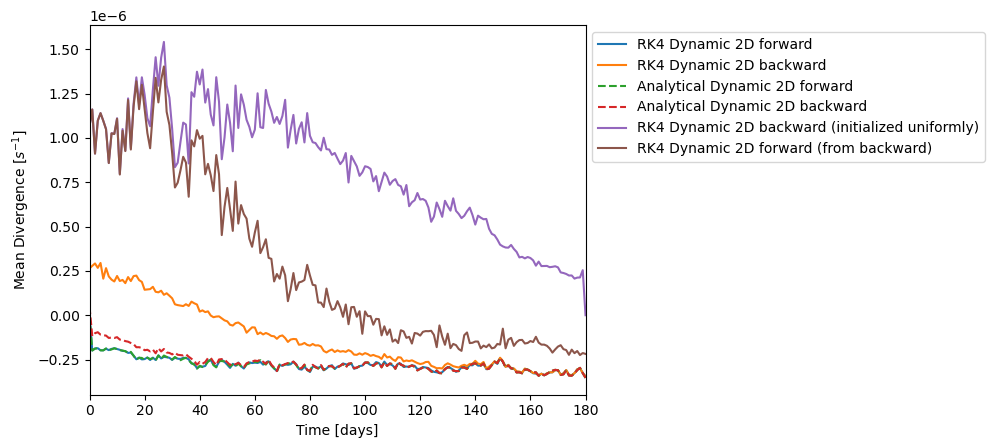

In [37]:
fig, ax = plt.subplots()

# res['RK4_2D_static_dt10_180d']['divergence'].mean('trajectory').plot(label="Stationary 2D forward")
# res['RK4_2D_static_dt10_180d_backw']['divergence'].mean('trajectory')[::-1].plot(label="Stationary 2D backward")

# res['RK4_2D_static_dt10_180d_backw_from_t0']['divergence'].mean('trajectory')[::-1].plot(label="Stationary 2D backward (from uniform)")
# res['RK4_2D_static_dt10_forward_from_backw_from_t0']['divergence'].mean('trajectory').plot(label="Stationary 2D forward (from backward)")


res['RK4_2D_dyn_dt10_180d']['divergence'].mean('trajectory').plot(label="RK4 Dynamic 2D forward")
res['RK4_2D_dyn_dt10_180d_backw']['divergence'].mean('trajectory')[::-1].plot(label="RK4 Dynamic 2D backward")

res['anal_2D_dynamic']['divergence'].mean('trajectory').plot(label="Analytical Dynamic 2D forward", linestyle='--')
res['anal_2D_dynamic_backw']['divergence'].mean('trajectory')[::-1].plot(label="Analytical Dynamic 2D backward", linestyle='--')


res['RK4_2D_dyn_dt10_180d_backw_from_t0']['divergence'].mean('trajectory')[::-1].plot(label="RK4 Dynamic 2D backward (initialized uniformly)")
res['RK4_2D_dyn_dt10_forward_from_backw_from_t0']['divergence'].mean('trajectory').plot(label="RK4 Dynamic 2D forward (from backward)")


ax.set_xlabel('Time [days]')
ax.set_ylabel('Mean Divergence [$s^{-1}$]')

ax.legend(loc='upper left', bbox_to_anchor=(1, 1))
ax.set_xlim(0, 180)
plt.savefig("figures/divergence_comparison_2D_dynamic.pdf", bbox_inches='tight')
plt.show()

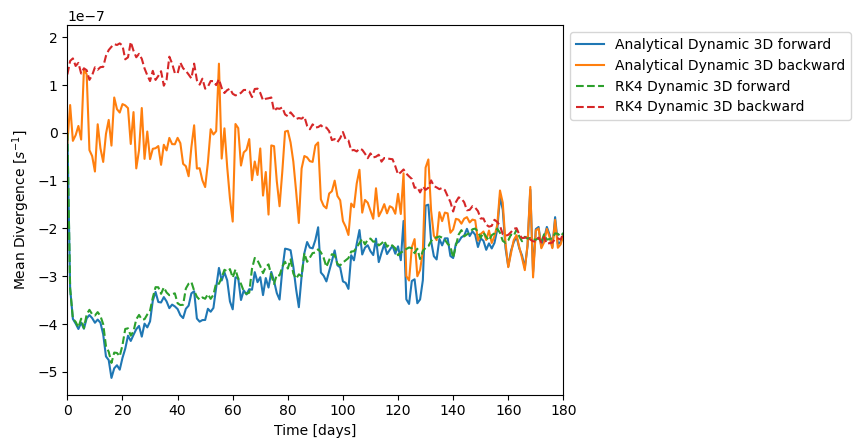

In [38]:
fig, ax = plt.subplots()

res['anal_3D_dynamic_z10']['divergence'].mean('trajectory').plot(label="Analytical Dynamic 3D forward")
res['anal_3D_dynamic_z10_backw']['divergence'].mean('trajectory')[::-1].plot(label="Analytical Dynamic 3D backward")

res['RK4_3D_dynamic_dt10_z10']['divergence'].mean('trajectory').plot(label="RK4 Dynamic 3D forward", linestyle='--')
res['RK4_3D_dynamic_dt10_z10_backw']['divergence'].mean('trajectory')[::-1].plot(label="RK4 Dynamic 3D backward", linestyle='--')


ax.set_xlabel('Time [days]')
ax.set_ylabel('Mean Divergence [$s^{-1}$]')

ax.legend(loc='upper left', bbox_to_anchor=(1, 1))
ax.set_xlim(0, 180)
plt.savefig("figures/divergence_comparison_3D_dynamic.pdf", bbox_inches='tight')
plt.show()

## Now with a perturbation

In [39]:
res['RK4_2D_dyn_dt10_backw_perturbed_100m']['divergence'] = post_interpolate_tfield(surface_divergence, res['RK4_2D_dyn_dt10_backw_perturbed_100m'], mode='dynamic')
res['RK4_2D_dyn_dt10_backw_perturbed_1m']['divergence'] = post_interpolate_tfield(surface_divergence, res['RK4_2D_dyn_dt10_backw_perturbed_1m'], mode='dynamic')
res['RK4_2D_dyn_dt10_backw_perturbed_1cm']['divergence'] = post_interpolate_tfield(surface_divergence, res['RK4_2D_dyn_dt10_backw_perturbed_1cm'], mode='dynamic')

Assuming dynamic field


181it [00:00, 441.04it/s]


Assuming dynamic field


181it [00:00, 442.91it/s]


Assuming dynamic field


181it [00:00, 442.74it/s]


In [40]:
from mpl_toolkits.axes_grid1.inset_locator import mark_inset, zoomed_inset_axes

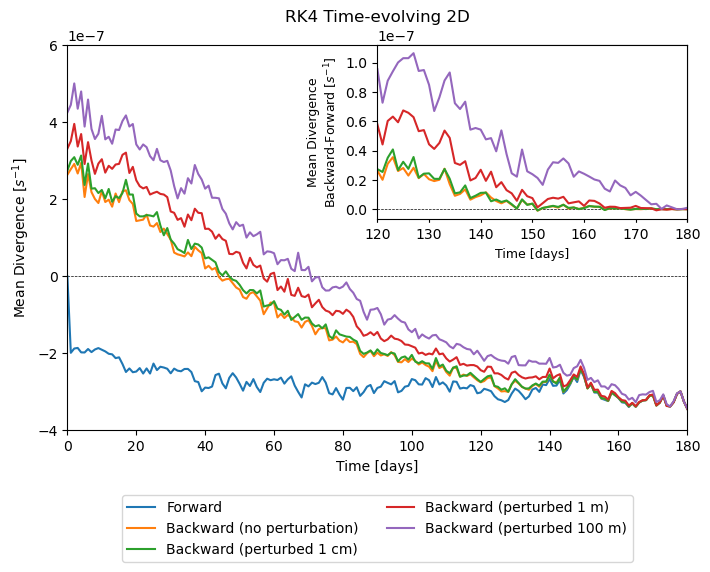

In [41]:
fig, ax = plt.subplots(nrows = 1, figsize=(8, 5))

res['RK4_2D_dyn_dt10_180d']['divergence'].mean('trajectory').plot(ax=ax, label="Forward")
res['RK4_2D_dyn_dt10_180d_backw']['divergence'].mean('trajectory')[::-1].plot(ax=ax, label="Backward (no perturbation)")
res['RK4_2D_dyn_dt10_backw_perturbed_1cm']['divergence'].mean('trajectory')[::-1].plot(ax=ax, label="Backward (perturbed 1 cm)")
res['RK4_2D_dyn_dt10_backw_perturbed_1m']['divergence'].mean('trajectory')[::-1].plot(ax=ax, label="Backward (perturbed 1 m)")
res['RK4_2D_dyn_dt10_backw_perturbed_100m']['divergence'].mean('trajectory')[::-1].plot(ax=ax, label="Backward (perturbed 100 m)")

ax.set_xlabel('Time [days]')
ax.set_ylabel('Mean Divergence [$s^{-1}$]')
ax.set_title("RK4 Time-evolving 2D")
ax.axhline(0, color='black', linestyle='--', linewidth=0.5, zorder=0)
ax.legend(loc='upper center', bbox_to_anchor=(0.5, -0.15), ncol=2)
ax.set_xlim(0, 180)
ax.set_ylim(-4e-7, 6e-7)

axins = ax.inset_axes([0.5, 0.55, 0.5, 0.45])
ref = res['RK4_2D_dyn_dt10_180d']['divergence'].isel(obs=slice(-61,None)).mean('trajectory')
(res['RK4_2D_dyn_dt10_180d_backw']['divergence'].isel(obs=slice(0,61)).mean('trajectory')[::-1] -ref).plot(x='T_day', ax=axins, color='C1')
(res['RK4_2D_dyn_dt10_backw_perturbed_1cm']['divergence'].isel(obs=slice(0,61)).mean('trajectory')[::-1] -ref).plot(x='T_day', ax=axins, color='C2')
(res['RK4_2D_dyn_dt10_backw_perturbed_1m']['divergence'].isel(obs=slice(0,61)).mean('trajectory')[::-1] -ref).plot(x='T_day', ax=axins, color='C3')
(res['RK4_2D_dyn_dt10_backw_perturbed_100m']['divergence'].isel(obs=slice(0,61)).mean('trajectory')[::-1] -ref).plot(x='T_day', ax=axins, color='C4')

axins.set_xlim(120, 180)
axins.axhline(0, color='black', linestyle='--', linewidth=0.5, zorder=0)
axins.set_xlabel('Time [days]', fontsize=9)
axins.set_ylabel('Mean Divergence\nBackward-Forward [$s^{-1}$]', fontsize=9)

plt.setp(axins.get_xticklabels(), backgroundcolor="white")

plt.savefig("figures/divergence_comparison_2D_dynamic_perturbed_rk4.pdf", bbox_inches='tight')
plt.show()

In [42]:
res['anal_2D_dynamic_backw_perturbed_100m']['divergence'] = post_interpolate_tfield(surface_divergence, res['anal_2D_dynamic_backw_perturbed_100m'], mode='dynamic')
res['anal_2D_dynamic_backw_perturbed_1m']['divergence'] = post_interpolate_tfield(surface_divergence, res['anal_2D_dynamic_backw_perturbed_1m'], mode='dynamic')
res['anal_2D_dynamic_backw_perturbed_1cm']['divergence'] = post_interpolate_tfield(surface_divergence, res['anal_2D_dynamic_backw_perturbed_1cm'], mode='dynamic')

Assuming dynamic field


45it [00:00, 443.95it/s]

181it [00:00, 442.62it/s]


Assuming dynamic field


181it [00:00, 445.13it/s]


Assuming dynamic field


181it [00:00, 445.62it/s]


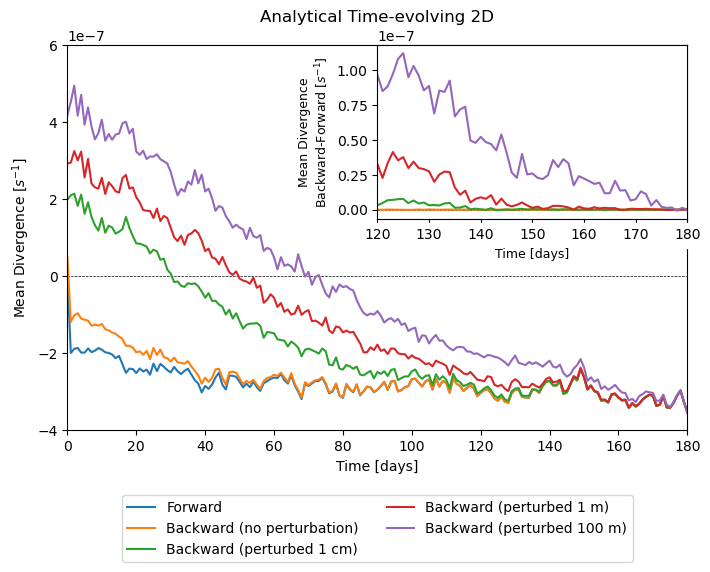

In [43]:
fig, ax = plt.subplots(nrows = 1, figsize=(8, 5))

res['anal_2D_dynamic']['divergence'].mean('trajectory').plot(ax=ax, label="Forward")
res['anal_2D_dynamic_backw']['divergence'].mean('trajectory')[::-1].plot(ax=ax, label="Backward (no perturbation)")
res['anal_2D_dynamic_backw_perturbed_1cm']['divergence'].mean('trajectory')[::-1].plot(ax=ax, label="Backward (perturbed 1 cm)")
res['anal_2D_dynamic_backw_perturbed_1m']['divergence'].mean('trajectory')[::-1].plot(ax=ax, label="Backward (perturbed 1 m)")
res['anal_2D_dynamic_backw_perturbed_100m']['divergence'].mean('trajectory')[::-1].plot(ax=ax, label="Backward (perturbed 100 m)")

ax.set_xlabel('Time [days]')
ax.set_ylabel('Mean Divergence [$s^{-1}$]')
ax.set_title("Analytical Time-evolving 2D")
ax.axhline(0, color='black', linestyle='--', linewidth=0.5, zorder=0)
ax.legend(loc='upper center', bbox_to_anchor=(0.5, -0.15), ncol=2)
ax.set_xlim(0, 180)
ax.set_ylim(-4e-7, 6e-7)

axins = ax.inset_axes([0.5, 0.55, 0.5, 0.45])
ref = res['anal_2D_dynamic']['divergence'].isel(obs=slice(-61,None)).mean('trajectory')
(res['anal_2D_dynamic_backw']['divergence'].isel(obs=slice(0,61)).mean('trajectory')[::-1] -ref).plot(x='T_day', ax=axins, color='C1')
(res['anal_2D_dynamic_backw_perturbed_1cm']['divergence'].isel(obs=slice(0,61)).mean('trajectory')[::-1] -ref).plot(x='T_day', ax=axins, color='C2')
(res['anal_2D_dynamic_backw_perturbed_1m']['divergence'].isel(obs=slice(0,61)).mean('trajectory')[::-1] -ref).plot(x='T_day', ax=axins, color='C3')
(res['anal_2D_dynamic_backw_perturbed_100m']['divergence'].isel(obs=slice(0,61)).mean('trajectory')[::-1] -ref).plot(x='T_day', ax=axins, color='C4')

axins.set_xlim(120, 180)
axins.axhline(0, color='black', linestyle='--', linewidth=0.5, zorder=0)
axins.set_xlabel('Time [days]', fontsize=9)
axins.set_ylabel('Mean Divergence\nBackward-Forward [$s^{-1}$]', fontsize=9)

plt.setp(axins.get_xticklabels(), backgroundcolor="white")
plt.savefig("figures/divergence_comparison_2D_dynamic_perturbed_analytical.pdf", bbox_inches='tight')
plt.show()

# Curl over time

In [44]:
def post_interpolate_ffield(da_field, pset, mode='stationary', how='nearest'):
    """
    Interpolate any tracer at the t-points using nearest neighbor.
    """
    X = pset.X.values
    Y = pset.Y.values

    if mode == 'stationary':
        print("Assuming stationary field")
        field_interp = Lm.F_nearest_interp_numpy(da_field.values, X.flatten(), Y.flatten())
        field_interp = field_interp.reshape(X.shape)
    else:
        print("Assuming dynamic field")
        assert np.all(pset.T % 86400 == 0), "Can only interpolate at output of ds_field for now"
        assert np.all(pset.T >= 0), "Nonnegative timestamps not allowed"
        field_interp = np.zeros_like(X) * np.nan
        T_steps = X.shape[0]
        for tidx, T in tqdm.tqdm(enumerate(pset.T.values)):
            field_tidx = int(T // 86400)
            field_interp_step = Lm.F_nearest_interp_numpy(da_field.isel(time=field_tidx).values, X[tidx], Y[tidx])
            field_interp[tidx, :] = field_interp_step

    ds_field = xr.DataArray(data=field_interp, coords=pset.coords, dims=pset.dims)
    return ds_field

In [45]:
surface_curl = (ds_derivatives.isel(Z=0, time=slice(0, 182)).dVdX/5000 - ds_derivatives.isel(Z=0, time=slice(0, 182)).dUdY/5000).load()

In [46]:
res['RK4_2D_static_dt10_180d']['curl'] = post_interpolate_tfield(surface_curl.isel(time=0), res['RK4_2D_static_dt10_180d'])
res['RK4_2D_static_dt10_180d_backw']['curl'] = post_interpolate_tfield(surface_curl.isel(time=0), res['RK4_2D_static_dt10_180d_backw'])
res['RK4_2D_static_dt10_180d_backw_from_t0']['curl'] = post_interpolate_tfield(surface_curl.isel(time=0), res['RK4_2D_static_dt10_180d_backw_from_t0'])
res['RK4_2D_static_dt10_forward_from_backw_from_t0']['curl'] = post_interpolate_tfield(surface_curl.isel(time=0), res['RK4_2D_static_dt10_forward_from_backw_from_t0'])
res['RK4_2D_dyn_dt10_180d']['curl'] = post_interpolate_tfield(surface_curl, res['RK4_2D_dyn_dt10_180d'], mode='dynamic')
res['RK4_2D_dyn_dt10_180d_backw']['curl'] = post_interpolate_tfield(surface_curl, res['RK4_2D_dyn_dt10_180d_backw'], mode='dynamic')
res['RK4_2D_dyn_dt10_180d_backw_from_t0']['curl'] = post_interpolate_tfield(surface_curl, res['RK4_2D_dyn_dt10_180d_backw_from_t0'], mode='dynamic')
res['RK4_2D_dyn_dt10_forward_from_backw_from_t0']['curl'] = post_interpolate_tfield(surface_curl, res['RK4_2D_dyn_dt10_forward_from_backw_from_t0'], mode='dynamic')


Assuming stationary field


Assuming stationary field
Assuming stationary field
Assuming stationary field
Assuming dynamic field


181it [00:00, 456.91it/s]


Assuming dynamic field


181it [00:00, 447.55it/s]


Assuming dynamic field


181it [00:00, 452.52it/s]


Assuming dynamic field


181it [00:00, 438.41it/s]


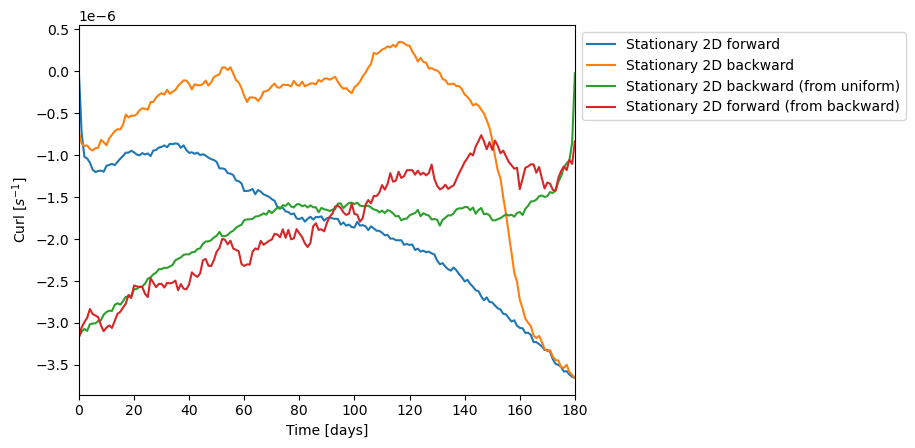

In [47]:
fig, ax = plt.subplots()

res['RK4_2D_static_dt10_180d']['curl'].mean('trajectory').plot(label="Stationary 2D forward")
res['RK4_2D_static_dt10_180d_backw']['curl'].mean('trajectory')[::-1].plot(label="Stationary 2D backward")

res['RK4_2D_static_dt10_180d_backw_from_t0']['curl'].mean('trajectory')[::-1].plot(label="Stationary 2D backward (from uniform)")
res['RK4_2D_static_dt10_forward_from_backw_from_t0']['curl'].mean('trajectory').plot(label="Stationary 2D forward (from backward)")


# res['RK4_2D_dyn_dt10_180d']['curl'].mean('trajectory').plot(label="Dynamic 2D forward")
# res['RK4_2D_dyn_dt10_180d_backw']['curl'].mean('trajectory')[::-1].plot(label="Dynamic 2D backward")

# res['RK4_2D_dyn_dt10_180d_backw_from_t0']['curl'].mean('trajectory')[::-1].plot(label="Dynamic 2D backward (from uniform)")
# res['RK4_2D_dyn_dt10_forward_from_backw_from_t0']['curl'].mean('trajectory').plot(label="Dynamic 2D forward (from backward)")


ax.set_xlabel('Time [days]')
ax.set_ylabel('Curl [$s^{-1}$]')

ax.legend(loc='upper left', bbox_to_anchor=(1, 1))
ax.set_xlim(0, 180)
plt.show()

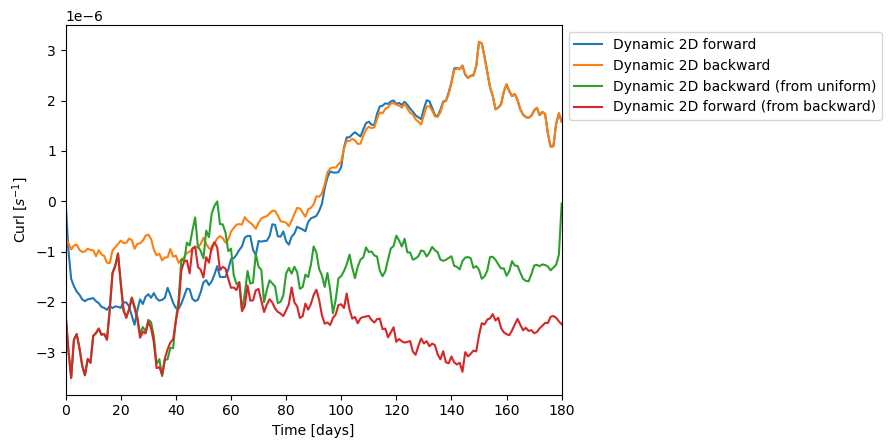

In [48]:
fig, ax = plt.subplots()

# res['RK4_2D_static_dt10_180d']['divergence'].mean('trajectory').plot(label="Stationary 2D forward")
# res['RK4_2D_static_dt10_180d_backw']['divergence'].mean('trajectory')[::-1].plot(label="Stationary 2D backward")

# res['RK4_2D_static_dt10_180d_backw_from_t0']['divergence'].mean('trajectory')[::-1].plot(label="Stationary 2D backward (from uniform)")
# res['RK4_2D_static_dt10_forward_from_backw_from_t0']['divergence'].mean('trajectory').plot(label="Stationary 2D forward (from backward)")


res['RK4_2D_dyn_dt10_180d']['curl'].mean('trajectory').plot(label="Dynamic 2D forward")
res['RK4_2D_dyn_dt10_180d_backw']['curl'].mean('trajectory')[::-1].plot(label="Dynamic 2D backward")

res['RK4_2D_dyn_dt10_180d_backw_from_t0']['curl'].mean('trajectory')[::-1].plot(label="Dynamic 2D backward (from uniform)")
res['RK4_2D_dyn_dt10_forward_from_backw_from_t0']['curl'].mean('trajectory').plot(label="Dynamic 2D forward (from backward)")


ax.set_xlabel('Time [days]')
ax.set_ylabel('Curl [$s^{-1}$]')

ax.legend(loc='upper left', bbox_to_anchor=(1, 1))
ax.set_xlim(0, 180)
plt.show()

# Sum of derivative strengths

In [49]:
ds_derivatives_surface = ds_derivatives.isel(Z=0).load()

In [50]:
def post_interpolate_sum_derivatives(ds_derivatives, pset, mode='stationary', how='nearest'):
    """
    Interpolate any tracer at the t-points
    """
    X = pset.X.values
    Y = pset.Y.values

    derivative_abs_sum_interp = np.zeros_like(X) * np.nan

    if mode != 'stationary':
        print("Assuming dynamic field")
        assert np.all(pset.T % 86400 == 0), "Can only interpolate at output of ds_field for now"
        assert np.all(pset.T >= 0), "Nonnegative timestamps not allowed"
        
    T_steps = X.shape[0]
    for tidx, T in tqdm.tqdm(enumerate(pset.T.values)):
        field_tidx = int(T // 86400)
        if mode == 'stationary':
            field_tidx = 0
        dUdX_interp_step = Lm.T_nearest_interp_numpy(ds_derivatives.dUdX.isel(time=field_tidx).values/5000, X[tidx], Y[tidx])
        dUdY_interp_step = Lm.F_nearest_interp_numpy(ds_derivatives.dUdY.isel(time=field_tidx).values/5000, X[tidx], Y[tidx])
        dVdX_interp_step = Lm.F_nearest_interp_numpy(ds_derivatives.dVdX.isel(time=field_tidx).values/5000, X[tidx], Y[tidx])
        dVdY_interp_step = Lm.T_nearest_interp_numpy(ds_derivatives.dVdY.isel(time=field_tidx).values/5000, X[tidx], Y[tidx])
        
        derivative_abs_sum_interp[tidx, :] = np.abs(dUdX_interp_step) + np.abs(dUdY_interp_step) + np.abs(dVdX_interp_step) + np.abs(dVdY_interp_step)

    ds_derivative_abs_sum_interp = xr.DataArray(data=derivative_abs_sum_interp, coords=pset.coords, dims=pset.dims)
    return ds_derivative_abs_sum_interp

In [51]:
reload(Lm)

<module 'Lagrangian_model' from '/storage/home/4302001/backtracking_play/channel/Lagrangian_model.py'>

In [52]:
res['RK4_2D_static_dt10_180d']['sumderiv'] = post_interpolate_sum_derivatives(ds_derivatives_surface, res['RK4_2D_static_dt10_180d'])
res['RK4_2D_static_dt10_180d_backw']['sumderiv'] = post_interpolate_sum_derivatives(ds_derivatives_surface, res['RK4_2D_static_dt10_180d_backw'])
res['RK4_2D_static_dt10_180d_backw_from_t0']['sumderiv'] = post_interpolate_sum_derivatives(ds_derivatives_surface, res['RK4_2D_static_dt10_180d_backw_from_t0'])
res['RK4_2D_static_dt10_forward_from_backw_from_t0']['sumderiv'] = post_interpolate_sum_derivatives(ds_derivatives_surface, res['RK4_2D_static_dt10_forward_from_backw_from_t0'])
res['RK4_2D_dyn_dt10_180d']['sumderiv'] = post_interpolate_sum_derivatives(ds_derivatives_surface, res['RK4_2D_dyn_dt10_180d'], mode='dynamic')
res['RK4_2D_dyn_dt10_180d_backw']['sumderiv'] = post_interpolate_sum_derivatives(ds_derivatives_surface, res['RK4_2D_dyn_dt10_180d_backw'], mode='dynamic')
res['RK4_2D_dyn_dt10_180d_backw_from_t0']['sumderiv'] = post_interpolate_sum_derivatives(ds_derivatives_surface, res['RK4_2D_dyn_dt10_180d_backw_from_t0'], mode='dynamic')
res['RK4_2D_dyn_dt10_forward_from_backw_from_t0']['sumderiv'] = post_interpolate_sum_derivatives(ds_derivatives_surface, res['RK4_2D_dyn_dt10_forward_from_backw_from_t0'], mode='dynamic')

0it [00:00, ?it/s]

181it [00:02, 72.30it/s] 
181it [00:01, 104.95it/s]
181it [00:01, 105.65it/s]
181it [00:01, 104.20it/s]


Assuming dynamic field


181it [00:01, 104.96it/s]


Assuming dynamic field


181it [00:01, 104.22it/s]


Assuming dynamic field


181it [00:01, 104.99it/s]


Assuming dynamic field


181it [00:01, 104.25it/s]


In [53]:
res['RK4_2D_static_dt10_180d']['sumderiv']

<xarray.DataArray 'sumderiv' (obs: 181, trajectory: 312000)>
array([[1.84509317e-05, 1.95013890e-05, 1.87694131e-05, ...,
        9.39296115e-06, 9.23308016e-06, 1.00684792e-05],
       [1.87694131e-05, 2.82043839e-05, 1.91267391e-05, ...,
        8.49060234e-06, 9.39296115e-06, 9.23308016e-06],
       [1.91267391e-05, 1.21039411e-05, 1.21039411e-05, ...,
        8.82656150e-06, 8.49060234e-06, 9.39296115e-06],
       ...,
       [3.40250881e-05, 3.40250881e-05, 3.40250881e-05, ...,
        3.13466699e-05, 2.57527499e-05, 3.45868139e-05],
       [3.40250881e-05, 3.40250881e-05, 3.40250881e-05, ...,
        2.90447624e-05, 3.19032661e-05, 2.44297989e-05],
       [3.40250881e-05, 3.40250881e-05, 3.40250881e-05, ...,
        2.33163428e-05, 2.63372240e-05, 3.27042289e-05]])
Coordinates:
    T        (obs) float64 0.0 8.64e+04 1.728e+05 ... 1.547e+07 1.555e+07
    T_day    (obs) float64 0.0 1.0 2.0 3.0 4.0 ... 176.0 177.0 178.0 179.0 180.0
Dimensions without coordinates: obs, trajectory

# Distances

In [54]:
distances = {
    name : compute_distance(res[name], res[name+"_backw"], signs=(-1, 1)) for name in qc_runs
}

In [55]:
distances['comp_2D_static_forward_rk4_anal'] = compute_distance(res['RK4_2D_static_dt10_180d'], res["anal_2D_static"], signs=(1, 1))
distances['comp_2D_dynamic_forward_rk4_anal'] = compute_distance(res['RK4_2D_dyn_dt10_180d'], res["anal_2D_dynamic"], signs=(1, 1))
distances['comp_3D_static_forward_rk4_anal_z10'] = compute_distance(res['RK4_3D_static_dt10_z10'], res["anal_3D_static_z10"], signs=(1, 1))
distances['comp_3D_static_forward_rk4_anal_z300'] = compute_distance(res['RK4_3D_static_dt10_z300'], res["anal_3D_static_z300"], signs=(1, 1))
distances['comp_3D_dynamic_forward_rk4_anal_z300'] = compute_distance(res['RK4_3D_dynamic_dt10_z300'], res["anal_3D_dynamic_z300"], signs=(1, 1))


In [56]:
stay_low_static_rk4 = ~(res['RK4_3D_static_dt10_z300'].Z > -6).any('obs')
stay_low_dynamic_rk4 = ~(res['RK4_3D_dynamic_dt10_z300'].Z > -6).any('obs')
stay_low_static_anal = ~(res['anal_3D_static_z300'].Z > -6).any('obs')
stay_low_dynamic_anal = ~(res['anal_3D_dynamic_z300'].Z > -6).any('obs')

In [57]:
stay_low_masks = {
    exp : ~(res[exp].Z > -6).any('obs') for exp in ['RK4_3D_static_dt10_z300', 'RK4_3D_dynamic_dt10_z300', 'anal_3D_static_z300', 'anal_3D_dynamic_z300']
}

In [58]:
stay_low_masks['RK4_3D_static_dt10_z300'].size

312000

In [59]:
for key in stay_low_masks.keys():
    print(key, int((~stay_low_masks[key]).sum().values)/stay_low_masks[key].size *100)

RK4_3D_static_dt10_z300 0.45224358974358975
RK4_3D_dynamic_dt10_z300 0.29967948717948717
anal_3D_static_z300 0.28589743589743594
anal_3D_dynamic_z300 0.19455128205128205


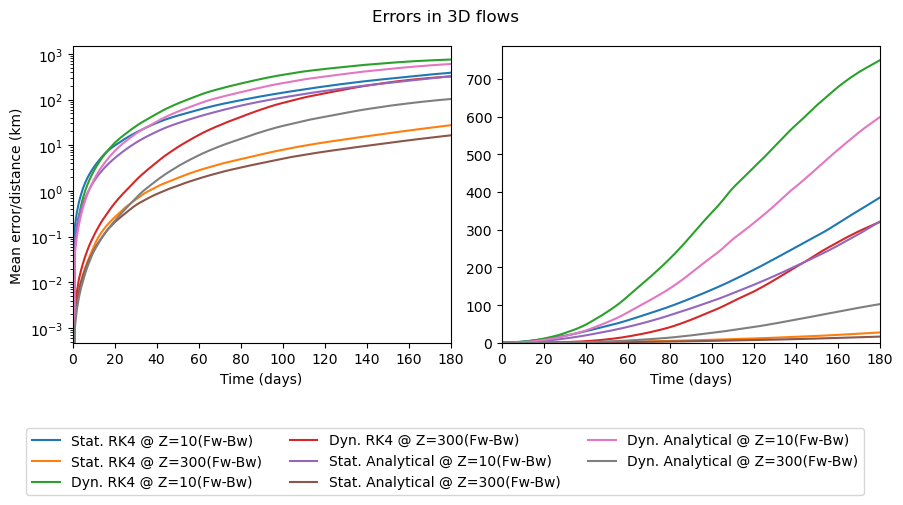

In [60]:
fig, axes = plt.subplots(ncols=2, figsize=(9,4))
lines = []  # To store the line objects for the legend
labels = []  # To store the labels for the legend
T = res['RK4_2D_static_dt10_180d'].T
for ax in axes:
    line1, = ax.plot(T / 24 / 60 / 60, distances['RK4_3D_static_dt10_z10'].mean('trajectory', skipna=True).values / 1000, label="Stat. RK4 @ Z=10(Fw-Bw)")
    line2, = ax.plot(T / 24 / 60 / 60, distances['RK4_3D_static_dt10_z300'][:, stay_low_static_rk4].mean('trajectory', skipna=True).values / 1000, label="Stat. RK4 @ Z=300(Fw-Bw)")
    line3, = ax.plot(T / 24 / 60 / 60, distances['RK4_3D_dynamic_dt10_z10'].mean('trajectory', skipna=True).values / 1000, label="Dyn. RK4 @ Z=10(Fw-Bw)")
    line4, = ax.plot(T / 24 / 60 / 60, distances['RK4_3D_dynamic_dt10_z300'][:, stay_low_static_rk4].mean('trajectory', skipna=True).values / 1000, label="Dyn. RK4 @ Z=300(Fw-Bw)")
    line5, = ax.plot(T / 24 / 60 / 60, distances['anal_3D_static_z10'].mean('trajectory', skipna=True).values / 1000, label="Stat. Analytical @ Z=10(Fw-Bw)")
    line6, = ax.plot(T / 24 / 60 / 60, distances['anal_3D_static_z300'][:, stay_low_static_anal].mean('trajectory', skipna=True).values / 1000, label="Stat. Analytical @ Z=300(Fw-Bw)")
    line7, = ax.plot(T / 24 / 60 / 60, distances['anal_3D_dynamic_z10'].mean('trajectory', skipna=True).values / 1000, label="Dyn. Analytical @ Z=10(Fw-Bw)")
    line8, = ax.plot(T / 24 / 60 / 60, distances['anal_3D_dynamic_z300'][:, stay_low_dynamic_anal].mean('trajectory', skipna=True).values / 1000, label="Dyn. Analytical @ Z=300(Fw-Bw)")
 

    ax.set_xlabel("Time (days)")
    ax.set_xlim(0, 180)

axes[0].set_yscale("log")
axes[0].set_ylabel("Mean error/distance (km)")

# Assuming you only need one instance of each label in the legend
if lines == []:  # Ensure this block runs only once
    lines = [line1, line2, line3, line4, line5, line6, line7, line8]
    labels = [line.get_label() for line in lines]

# ax.set_ylim(0, np.max([np.mean(dist_10_dynamic, axis=1), np.mean(dist_10_static, axis=1)])/1000)
axes[0].set_yscale("log")
axes[0].set_ylabel("Mean error/distance (km)")
fig.legend(lines, labels, loc='upper center', bbox_to_anchor=(0.5, -0.05), ncol=3)
axes[1].set_ylim(0, None)
fig.suptitle("Errors in 3D flows")
fig.tight_layout()

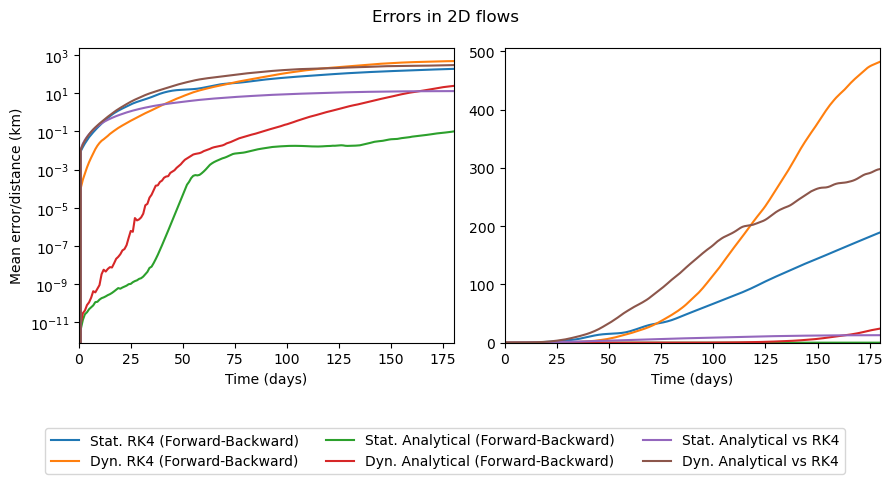

In [61]:
fig, axes = plt.subplots(ncols=2, figsize=(9,4))
lines = []  # To store the line objects for the legend
labels = []  # To store the labels for the legend
T = res['RK4_2D_static_dt10_180d'].T
for ax in axes:
    line1, = ax.plot(T / 24 / 60 / 60, distances['RK4_2D_static_dt10_180d'].mean('trajectory', skipna=True).values / 1000, label="Stat. RK4 (Forward-Backward)")
    line2, = ax.plot(T / 24 / 60 / 60, distances['RK4_2D_dyn_dt10_180d'].mean('trajectory', skipna=True).values / 1000, label="Dyn. RK4 (Forward-Backward)")
    line3, = ax.plot(T / 24 / 60 / 60, distances['anal_2D_static'].mean('trajectory', skipna=True).values / 1000, label="Stat. Analytical (Forward-Backward)")
    line4, = ax.plot(T / 24 / 60 / 60, distances['anal_2D_dynamic'].mean('trajectory', skipna=True).values / 1000, label="Dyn. Analytical (Forward-Backward)")
    line5, = ax.plot(T / 24 / 60 / 60, distances['comp_2D_static_forward_rk4_anal'].mean('trajectory', skipna=True).values / 1000, label="Stat. Analytical vs RK4")
    line6, = ax.plot(T / 24 / 60 / 60, distances['comp_2D_dynamic_forward_rk4_anal'].mean('trajectory', skipna=True).values / 1000, label="Dyn. Analytical vs RK4")


    ax.set_xlabel("Time (days)")
    ax.set_xlim(0, 180)

axes[0].set_yscale("log")
axes[0].set_ylabel("Mean error/distance (km)")

# Assuming you only need one instance of each label in the legend
if lines == []:  # Ensure this block runs only once
    lines = [line1, line2, line3, line4, line5, line6]
    labels = [line.get_label() for line in lines]

# ax.set_ylim(0, np.max([np.mean(dist_10_dynamic, axis=1), np.mean(dist_10_static, axis=1)])/1000)
axes[0].set_yscale("log")
axes[0].set_ylabel("Mean error/distance (km)")
fig.legend(lines, labels, loc='upper center', bbox_to_anchor=(0.5, -0.05), ncol=3)
axes[1].set_ylim(0, None)
fig.suptitle("Errors in 2D flows")
fig.tight_layout()

# Timestep sensitivity

In [62]:
distances['rk4_2D_dyn_dt1m'] = compute_distance(res['rk4_2D_dyn_dt1m'], res["rk4_2D_dyn_dt1m_backw"], signs=(-1, 1))
distances['rk4_2D_dyn_dt1h'] = compute_distance(res['rk4_2D_dyn_dt1h'], res["rk4_2D_dyn_dt1h_backw"], signs=(-1, 1))
distances['rk4_2D_dyn_dt6h'] = compute_distance(res['rk4_2D_dyn_dt6h'], res["rk4_2D_dyn_dt6h_backw"], signs=(-1, 1))


In [64]:
res['rk4_2D_dyn_dt1m']['divergence'] = post_interpolate_tfield(surface_divergence.isel(time=0), res['rk4_2D_dyn_dt1m'])
res['rk4_2D_dyn_dt1h']['divergence'] = post_interpolate_tfield(surface_divergence.isel(time=0), res['rk4_2D_dyn_dt1h'])
res['rk4_2D_dyn_dt6h']['divergence'] = post_interpolate_tfield(surface_divergence.isel(time=0), res['rk4_2D_dyn_dt6h'])
res['rk4_2D_dyn_dt1m_backw']['divergence'] = post_interpolate_tfield(surface_divergence.isel(time=0), res['rk4_2D_dyn_dt1m_backw'])
res['rk4_2D_dyn_dt1h_backw']['divergence'] = post_interpolate_tfield(surface_divergence.isel(time=0), res['rk4_2D_dyn_dt1h_backw'])
res['rk4_2D_dyn_dt6h_backw']['divergence'] = post_interpolate_tfield(surface_divergence.isel(time=0), res['rk4_2D_dyn_dt6h_backw'])

Assuming stationary field
Assuming stationary field


Assuming stationary field
Assuming stationary field
Assuming stationary field
Assuming stationary field


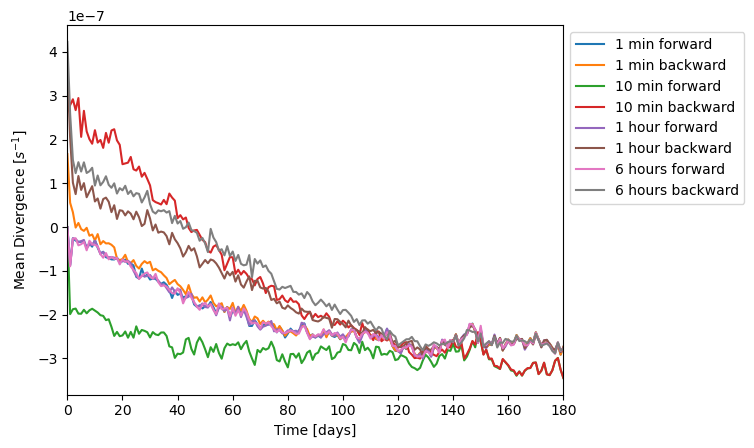

<Figure size 640x480 with 0 Axes>

In [65]:
fig, ax = plt.subplots()

res['rk4_2D_dyn_dt1m']['divergence'].mean('trajectory').plot(label="1 min forward")
res['rk4_2D_dyn_dt1m_backw']['divergence'].mean('trajectory')[::-1].plot(label="1 min backward")

res['RK4_2D_dyn_dt10_180d']['divergence'].mean('trajectory').plot(label="10 min forward")
res['RK4_2D_dyn_dt10_180d_backw']['divergence'].mean('trajectory')[::-1].plot(label="10 min backward")

res['rk4_2D_dyn_dt1h']['divergence'].mean('trajectory').plot(label="1 hour forward")
res['rk4_2D_dyn_dt1h_backw']['divergence'].mean('trajectory')[::-1].plot(label="1 hour backward")

res['rk4_2D_dyn_dt6h']['divergence'].mean('trajectory').plot(label="6 hours forward")
res['rk4_2D_dyn_dt6h_backw']['divergence'].mean('trajectory')[::-1].plot(label="6 hours backward")


ax.set_xlabel('Time [days]')
ax.set_ylabel('Mean Divergence [$s^{-1}$]')
# ax.set_title("RK4 timestep sensitivity")
ax.legend(loc='upper left', bbox_to_anchor=(1, 1))
ax.set_xlim(0, 180)
plt.show()
plt.savefig("figures/divergence_comparison_2D_dynamic_timestep_sensitivity.pdf", bbox_inches='tight')

In [66]:
res['anal_2D_dynamic_dt1m']['divergence'] = post_interpolate_tfield(surface_divergence.isel(time=0), res['anal_2D_dynamic_dt1m'])
res['anal_2D_dynamic_dt1m_backw']['divergence'] = post_interpolate_tfield(surface_divergence.isel(time=0), res['anal_2D_dynamic_dt1m_backw'])
res['anal_2D_dynamic_dt1h']['divergence'] = post_interpolate_tfield(surface_divergence.isel(time=0), res['anal_2D_dynamic_dt1h'])
res['anal_2D_dynamic_dt1h_backw']['divergence'] = post_interpolate_tfield(surface_divergence.isel(time=0), res['anal_2D_dynamic_dt1h_backw'])
res['anal_2D_dynamic_dt6h']['divergence'] = post_interpolate_tfield(surface_divergence.isel(time=0), res['anal_2D_dynamic_dt6h'])
res['anal_2D_dynamic_dt6h_backw']['divergence'] = post_interpolate_tfield(surface_divergence.isel(time=0), res['anal_2D_dynamic_dt6h_backw'])
res['anal_2D_dynamic_dt1d']['divergence'] = post_interpolate_tfield(surface_divergence.isel(time=0), res['anal_2D_dynamic_dt1d'])
res['anal_2D_dynamic_dt1d_backw']['divergence'] = post_interpolate_tfield(surface_divergence.isel(time=0), res['anal_2D_dynamic_dt1d_backw'])

Assuming stationary field


Assuming stationary field
Assuming stationary field
Assuming stationary field
Assuming stationary field
Assuming stationary field
Assuming stationary field
Assuming stationary field


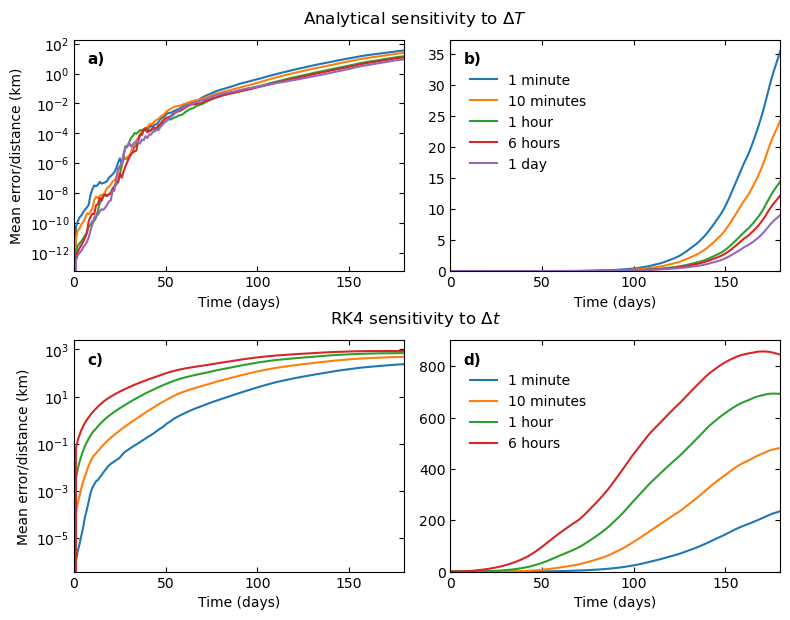

In [69]:
fig, axes = plt.subplots(ncols=2, nrows=2, figsize=(8,6))

T = res['RK4_2D_static_dt10_180d'].T
for ax in axes[0]:
    ax.plot(T / 24 / 60 / 60, distances['anal_2D_dynamic_dt1m'].mean('trajectory', skipna=True).values / 1000, label="1 minute")
    ax.plot(T / 24 / 60 / 60, distances['anal_2D_dynamic'].mean('trajectory', skipna=True).values / 1000, label="10 minutes")
    ax.plot(T / 24 / 60 / 60, distances['anal_2D_dynamic_dt1h'].mean('trajectory', skipna=True).values / 1000, label="1 hour")
    ax.plot(T / 24 / 60 / 60, distances['anal_2D_dynamic_dt6h'].mean('trajectory', skipna=True).values / 1000, label="6 hours")
    ax.plot(T / 24 / 60 / 60, distances['anal_2D_dynamic_dt1d'].mean('trajectory', skipna=True).values / 1000, label="1 day")

for ax in axes[1]:
    ax.plot(T / 24 / 60 / 60, distances['rk4_2D_dyn_dt1m'].mean('trajectory', skipna=True).values / 1000, label="1 minute")
    ax.plot(T / 24 / 60 / 60, distances['RK4_2D_dyn_dt10_180d'].mean('trajectory', skipna=True).values / 1000, label="10 minutes")
    ax.plot(T / 24 / 60 / 60, distances['rk4_2D_dyn_dt1h'].mean('trajectory', skipna=True).values / 1000, label="1 hour")
    ax.plot(T / 24 / 60 / 60, distances['rk4_2D_dyn_dt6h'].mean('trajectory', skipna=True).values / 1000, label="6 hours")

axes[0, 1].legend(loc='upper left', ncol=1, frameon=False)

for ax in axes[:, 0]:
    ax.set_yscale("log")
    ax.set_ylabel("Mean error/distance (km)")

for ax in axes[:, 1]:
    ax.set_ylim(0, None)
    ax.legend(loc='upper left', ncol=1, frameon=False, bbox_to_anchor=(0.02, 0.91))

for i, ax in enumerate(axes.flatten()):
    ax.tick_params(axis='x', direction='in', which='both', top=True)
    ax.tick_params(axis='y', direction='in', which='both', right=True)
    ax.set_xlim(0, 180)
    ax.set_xlabel("Time (days)")


    ax.text(0.04, 0.95, chr(97+i)+")", transform=ax.transAxes, va='top', fontweight='bold', fontsize=11)

# set a shared title for the upper row and another for the lower row

plt.figtext(0.525, 1.01, "Analytical sensitivity to $\Delta T$", ha='center', va='center', fontsize=12)
plt.figtext(0.525, 0.51, "RK4 sensitivity to $\Delta t$", ha='center', va='center', fontsize=12)

fig.tight_layout()
fig.subplots_adjust(hspace=0.3)

plt.savefig("figures/timestep_sensitivity_both.pdf", bbox_inches='tight')

# Effective diffusivities and velocities

In [70]:
eff_diff = {}
eff_vel = {}
for key in tqdm.tqdm(qc_runs):
    if key in stay_low_masks.keys():
        eff_diff[key] = (distances[key][:, stay_low_masks[key]] ** 2 / (2 * res[key].T)).mean('trajectory')
        eff_vel[key] = (distances[key][:, stay_low_masks[key]] / (res[key].T)).mean('trajectory')
    else:
        eff_diff[key] = (distances[key] ** 2 / (2 * res[key].T)).mean('trajectory')
        eff_vel[key] = (distances[key] / (res[key].T)).mean('trajectory')

100%|██████████| 19/19 [00:20<00:00,  1.06s/it]


In [71]:
pretty_short_names = {"RK4_2D_static_dt10_180d" : "RK4 Stationary",
                      "RK4_2D_dyn_dt10_180d" : "RK4 Dynamic",
                      "anal_2D_static" : "Analytical Stationary",
                      "anal_2D_dynamic" : 'Analytical Dynamic'}

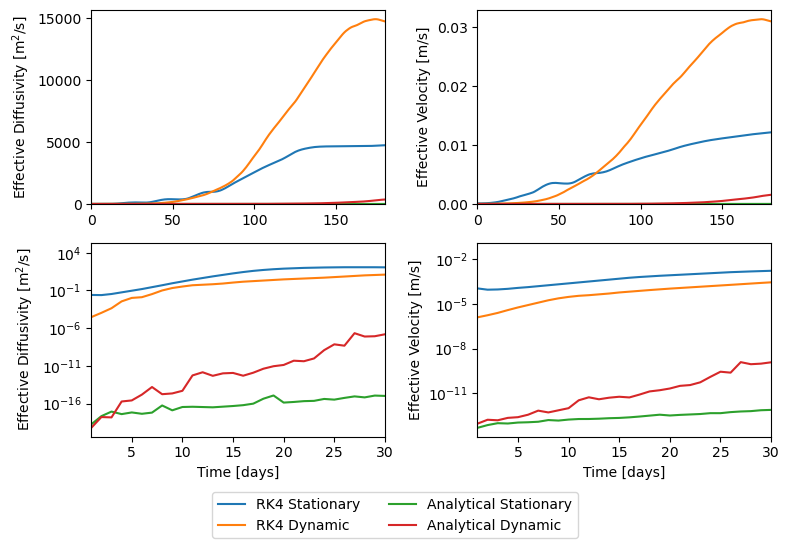

In [72]:
fig, axes = plt.subplots(ncols=2, nrows=2, figsize=(8,5))
lines = []
days = np.arange(0,181, 1)
for key in ['RK4_2D_static_dt10_180d', 'RK4_2D_dyn_dt10_180d', 'anal_2D_static', 'anal_2D_dynamic']:
    line, = axes[0, 0].plot(days, eff_diff[key], label=pretty_short_names[key])
    axes[0, 1].plot(days, eff_vel[key])
    axes[1, 0].plot(days, eff_diff[key])
    axes[1, 1].plot(days, eff_vel[key])
    lines.append(line)

for ax in [axes[0, 0], axes[0, 1]]:
    ax.set_ylim(0, None)

axes[0, 0].set_ylabel("Effective Diffusivity [m$^2$/s]")
axes[0, 1].set_ylabel("Effective Velocity [m/s]")
axes[1, 0].set_ylabel("Effective Diffusivity [m$^2$/s]")
axes[1, 1].set_ylabel("Effective Velocity [m/s]")

axes[0, 0].set_xlim(0, 180)
axes[0, 1].set_xlim(0, 180)
axes[1, 0].set_xlim(1, 30)
axes[1, 1].set_xlim(1, 30)

axes[1, 0].set_xlabel("Time [days]")
axes[1, 1].set_xlabel("Time [days]")

axes[1, 0].set_yscale('log')
axes[1, 1].set_yscale('log')

fig.legend(handles=lines, labels=[line.get_label() for line in lines], loc='lower center',bbox_to_anchor=(0.5, -0.1), ncol=2)


fig.tight_layout()


In [73]:
qc_runs

['anal_2D_dynamic',
 'anal_3D_static_z300',
 'anal_2D_dynamic_dt1h',
 'anal_2D_dynamic_dt6h',
 'rk4_2D_dyn_dt6h',
 'rk4_2D_dyn_dt1m',
 'anal_2D_dynamic_dt1d',
 'RK4_2D_static_dt10_180d',
 'RK4_2D_dyn_dt10_180d',
 'RK4_3D_static_dt10_z10',
 'RK4_3D_static_dt10_z300',
 'RK4_3D_dynamic_dt10_z10',
 'RK4_3D_dynamic_dt10_z300',
 'anal_2D_static',
 'anal_3D_static_z10',
 'anal_3D_dynamic_z10',
 'anal_3D_dynamic_z300',
 'rk4_2D_dyn_dt1h',
 'anal_2D_dynamic_dt1m']

In [74]:
pretty_short_names['RK4_3D_static_dt10_z10'] = r"RK4 stationary ($z_\text{init}=10$ m)"
pretty_short_names['RK4_3D_dynamic_dt10_z10'] = r"RK4 dynamic ($z_\text{init}=10$ m)"
pretty_short_names['RK4_3D_static_dt10_z300'] = r"RK4 stationary ($z_\text{init}=300$ m)"
pretty_short_names['RK4_3D_dynamic_dt10_z300'] = r"RK4 dynamic ($z_\text{init}=300$ m)"
pretty_short_names['anal_3D_static_z10'] = r"Analytical stationary ($z_\text{init}=10$ m)"
pretty_short_names['anal_3D_dynamic_z10'] = r"Analytical dynamic ($z_\text{init}=10$ m)"
pretty_short_names['anal_3D_static_z300'] = r"Analytical stationary ($z_\text{init}=300$ m)"
pretty_short_names['anal_3D_dynamic_z300'] = r"Analytical dynamic ($z_\text{init}=300$ m)"


# Plotting distances and diffusivities together

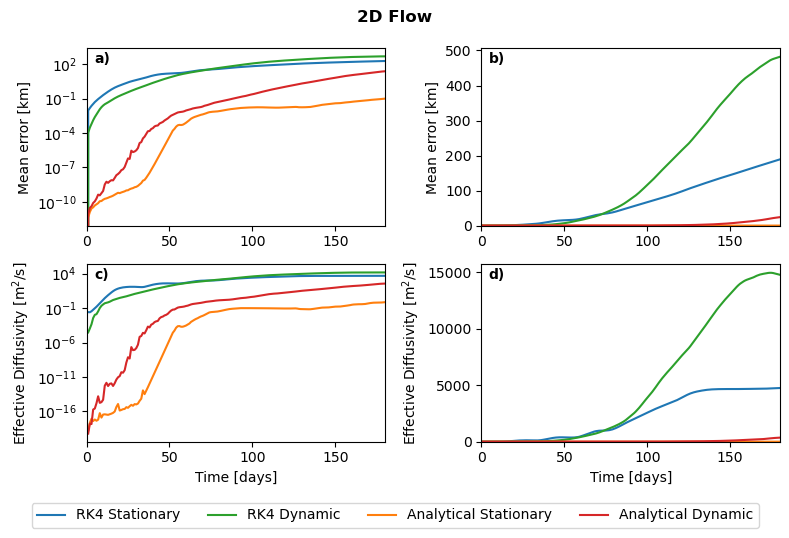

In [116]:
fig, axes = plt.subplots(ncols=2, nrows=2, figsize=(8, 5))
lines = []
colors = ['tab:blue', 'tab:green', 'tab:orange', 'tab:red']
days = np.arange(0,181, 1)
for i, key in enumerate(['RK4_2D_static_dt10_180d', 'RK4_2D_dyn_dt10_180d', 'anal_2D_static', 'anal_2D_dynamic']):
    line, = axes[0, 0].plot(T / 24 / 60 / 60, distances[key].mean('trajectory', skipna=True).values / 1000, label=pretty_short_names[key], color=colors[i])
    axes[0, 1].plot(T / 24 / 60 / 60, distances[key].mean('trajectory', skipna=True).values / 1000, label=pretty_short_names[key], color=colors[i])
    axes[1, 0].plot(days, eff_diff[key], color=colors[i])
    axes[1, 1].plot(days, eff_diff[key], color=colors[i])
    lines.append(line)

for ax in [axes[0, 1], axes[1, 1]]:
    ax.set_ylim(0, None)

axes[0, 0].set_ylabel("Mean error [km]")
axes[0, 1].set_ylabel("Mean error [km]")
axes[1, 0].set_ylabel("Effective Diffusivity [m$^2$/s]")
axes[1, 1].set_ylabel("Effective Diffusivity [m$^2$/s]")

axes[1, 0].set_xlabel("Time [days]")
axes[1, 1].set_xlabel("Time [days]")

axes[0, 0].set_yscale('log')
axes[1, 0].set_yscale('log')

for axidx, ax in enumerate(axes.flatten()):
    ax.set_xlim(0, 180)
    ax.text(0.025, 0.92, chr(65 + axidx).lower() + ")", transform=ax.transAxes, size=10, weight='bold')

fig.legend(handles=lines, labels=[line.get_label() for line in lines], loc='lower center',bbox_to_anchor=(0.5, -0.07), ncol=4)
fig.suptitle("2D Flow", fontweight='bold')
fig.tight_layout()


plt.savefig("figures/2D_error_diff_comparison.pdf", bbox_inches='tight')


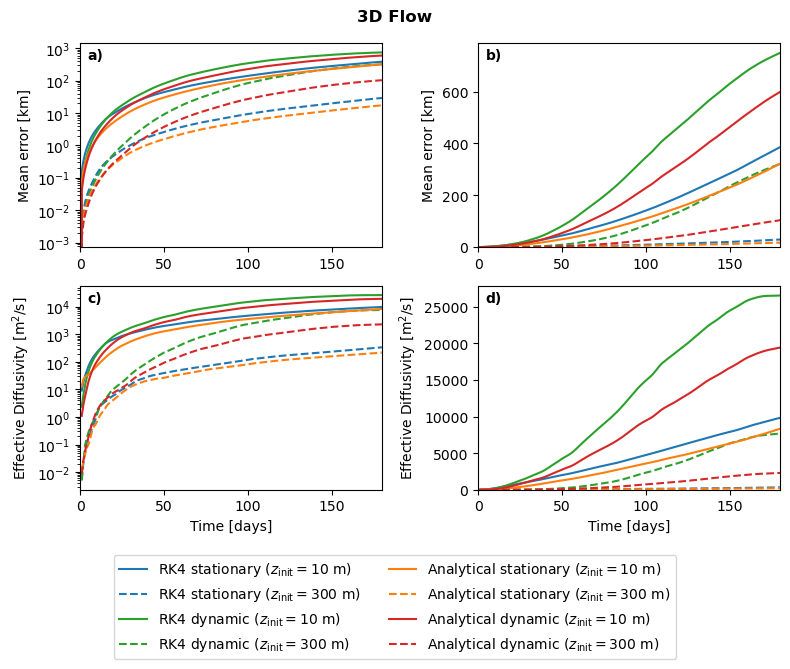

In [118]:
fig, axes = plt.subplots(ncols=2, nrows=2, figsize=(8, 5.5))
lines = []
days = np.arange(0,181, 1)
colors = ['tab:blue', 'tab:blue', 'tab:green', 'tab:green', 'tab:orange', 'tab:orange', 'tab:red', 'tab:red']
linestyle = ['solid', 'dashed', 'solid', 'dashed', 'solid', 'dashed', 'solid', 'dashed']
for i, key in enumerate(['RK4_3D_static_dt10_z10', 'RK4_3D_static_dt10_z300', 'RK4_3D_dynamic_dt10_z10', 'RK4_3D_dynamic_dt10_z300', 'anal_3D_static_z10', 'anal_3D_static_z300', 'anal_3D_dynamic_z10', 'anal_3D_dynamic_z300']):
    line, = axes[0, 0].plot(T / 24 / 60 / 60, distances[key].mean('trajectory', skipna=True).values / 1000, label=pretty_short_names[key], color=colors[i], linestyle=linestyle[i])
    axes[0, 1].plot(T / 24 / 60 / 60, distances[key].mean('trajectory', skipna=True).values / 1000, label=pretty_short_names[key], color=colors[i], linestyle=linestyle[i])
    axes[1, 0].plot(days, eff_diff[key], color=colors[i], linestyle=linestyle[i])
    axes[1, 1].plot(days, eff_diff[key], color=colors[i], linestyle=linestyle[i])
    lines.append(line)

for ax in [axes[0, 1], axes[1, 1]]:
    ax.set_ylim(0, None)

axes[0, 0].set_ylabel("Mean error [km]")
axes[0, 1].set_ylabel("Mean error [km]")
axes[1, 0].set_ylabel("Effective Diffusivity [m$^2$/s]")
axes[1, 1].set_ylabel("Effective Diffusivity [m$^2$/s]")

axes[1, 0].set_xlabel("Time [days]")
axes[1, 1].set_xlabel("Time [days]")

axes[0, 0].set_yscale('log')
axes[1, 0].set_yscale('log')

for axidx, ax in enumerate(axes.flatten()):
    ax.set_xlim(0, 180)
    ax.text(0.025, 0.92, chr(65 + axidx).lower() + ")", transform=ax.transAxes, size=10, weight='bold')

fig.legend(handles=lines, labels=[line.get_label() for line in lines], loc='upper center',bbox_to_anchor=(0.5, 0), ncol=2)
fig.suptitle("3D Flow", fontweight='bold')
fig.tight_layout()

plt.savefig("figures/3D_error_diff_comparison.pdf", bbox_inches='tight')


# Trajectories

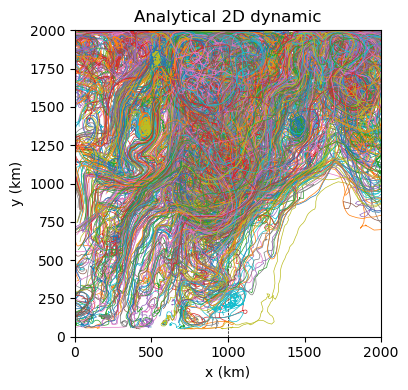

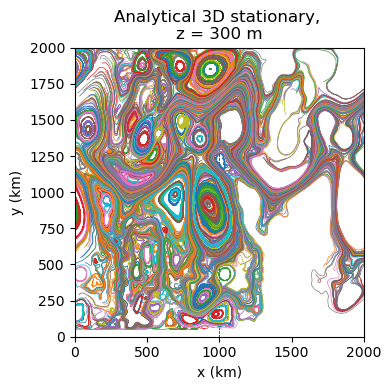

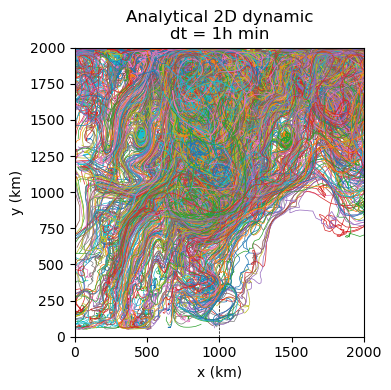

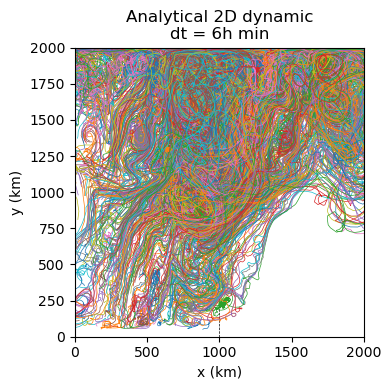

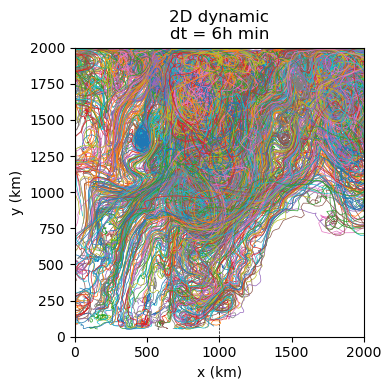

...

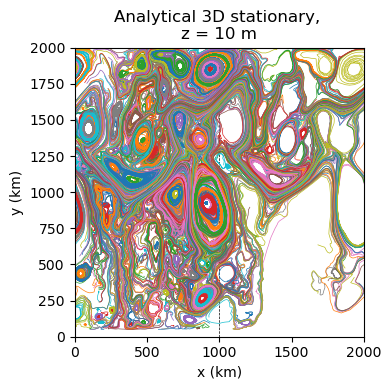

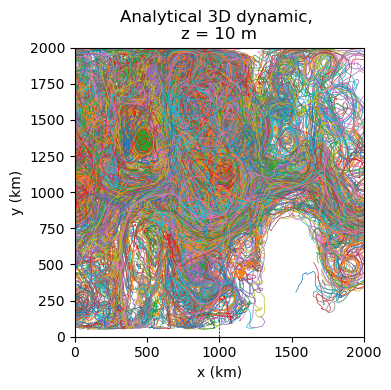

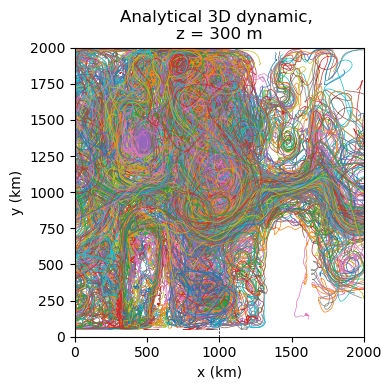

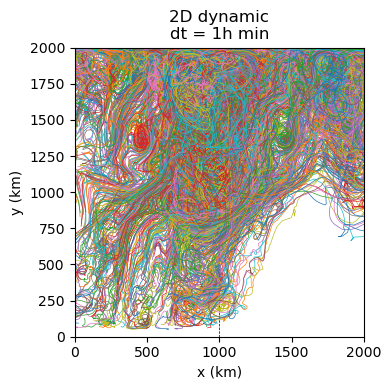

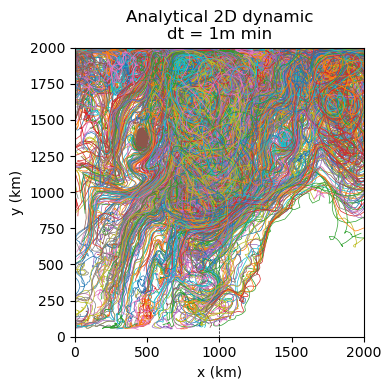

In [78]:
for expname in qc_runs:
    plot_trajectories(res[expname], title=pretty_names[expname])

# Maps

In [80]:
dx_bins = 50_000
dy_bins = 50_000
x_bins = np.arange(0, 1_000_000 + dx_bins, dx_bins)
y_bins = np.arange(0, 2_000_000 + dy_bins, dy_bins)


In [81]:
initial_per_bin = 400

In [86]:
def plot_histograms(pset_init, pset_backw, x_bins, y_bins, initial_per_bin, title=None, showtitle=True, cbar=True, save=False, addmask=None):
    fig, ax = plt.subplots(figsize=(5,3))
    ax.set_aspect(1)

    mask = np.isfinite(pset_backw.X)

    if addmask is not None:
        mask = mask & addmask

    counts_init, _, _ = np.histogram2d(pset_init.X[mask] % 1_000_000, pset_init.Y[mask], bins=[x_bins, y_bins])
    counts_backw, _, _ = np.histogram2d(pset_backw.X[mask] % 1_000_000, pset_backw.Y[mask], bins=[x_bins, y_bins])
    count_plot = ax.pcolormesh(x_bins/1000, y_bins/1000, (counts_backw.T - counts_init.T)/ counts_init.T, cmap='RdBu_r', vmin=-1, vmax=1)
    ax.set_xlabel("X [km]")
    ax.set_ylabel("Y [km]")

    if title and showtitle:
        ax.set_title(title)
    # add a colorbar
    if cbar:
        fig.colorbar(count_plot, label="Difference between forward and backward initial distribution", extend='max')

    if save:
        fig.savefig(f"figures/histograms/histogram_{title}.pdf", bbox_inches='tight')
    plt.show()


In [87]:
def add_histogram_component(ax, run, x_bins=x_bins, y_bins=y_bins, returns=False):
    pset_init = res[run].isel(obs=0)
    pset_backw = res[run + "_backw"].isel(obs=-1)

    mask = np.isfinite(pset_backw.X)
    if run in stay_low_masks.keys():
        mask = mask & stay_low_masks[run]

    counts_init, _, _ = np.histogram2d(pset_init.X[mask] % 1_000_000, pset_init.Y[mask], bins=[x_bins, y_bins])
    counts_backw, _, _ = np.histogram2d(pset_backw.X[mask] % 1_000_000, pset_backw.Y[mask], bins=[x_bins, y_bins])
    counts = ax.pcolormesh(x_bins/1000, y_bins/1000, (counts_backw.T - counts_init.T)/ counts_init.T, cmap='RdBu_r', vmin=-1, vmax=1)
    if returns:
        return counts
    

In [88]:
def compute_RMSE(run, x_bins=x_bins, y_bins=y_bins):
    pset_init = res[run].isel(obs=0)
    pset_backw = res[run + "_backw"].isel(obs=-1)

    mask = np.isfinite(pset_backw.X)
    if run in stay_low_masks.keys():
        mask = mask & stay_low_masks[run]

    counts_init, _, _ = np.histogram2d(pset_init.X[mask] % 1_000_000, pset_init.Y[mask], bins=[x_bins, y_bins])
    counts_backw, _, _ = np.histogram2d(pset_backw.X[mask] % 1_000_000, pset_backw.Y[mask], bins=[x_bins, y_bins])
    normalized_diff = (counts_backw.T - counts_init.T)/ counts_init.T
    
    return np.sqrt(np.nansum(normalized_diff ** 2) / np.sum(np.isfinite(normalized_diff)))

In [89]:
for run in qc_runs:
    # print RMSE with 3 digits
    print(f"{run}: {compute_RMSE(run):.3f}")

/tmp/ipykernel_3573/1322176949.py:11: RuntimeWarning: invalid value encountered in divide
  normalized_diff = (counts_backw.T - counts_init.T)/ counts_init.T


anal_2D_dynamic: 0.039
anal_3D_static_z300: 0.033
anal_2D_dynamic_dt1h: 0.029
anal_2D_dynamic_dt6h: 0.027
rk4_2D_dyn_dt6h: 0.956
rk4_2D_dyn_dt1m: 0.214
anal_2D_dynamic_dt1d: 0.022
RK4_2D_static_dt10_180d: 0.720
RK4_2D_dyn_dt10_180d: 0.456
RK4_3D_static_dt10_z10: 0.416
RK4_3D_static_dt10_z300: 0.044
RK4_3D_dynamic_dt10_z10: 0.404
RK4_3D_dynamic_dt10_z300: 0.091
anal_2D_static: 0.006
anal_3D_static_z10: 0.337
anal_3D_dynamic_z10: 0.416
anal_3D_dynamic_z300: 0.055
rk4_2D_dyn_dt1h: 0.716
anal_2D_dynamic_dt1m: 0.051


/tmp/ipykernel_3573/1696334210.py:11: RuntimeWarning: invalid value encountered in divide
  counts = ax.pcolormesh(x_bins/1000, y_bins/1000, (counts_backw.T - counts_init.T)/ counts_init.T, cmap='RdBu_r', vmin=-1, vmax=1)


/tmp/ipykernel_3573/1322176949.py:11: RuntimeWarning: invalid value encountered in divide
  normalized_diff = (counts_backw.T - counts_init.T)/ counts_init.T
/tmp/ipykernel_3573/1322176949.py:11: RuntimeWarning: invalid value encountered in divide
  normalized_diff = (counts_backw.T - counts_init.T)/ counts_init.T
/tmp/ipykernel_3573/1322176949.py:11: RuntimeWarning: invalid value encountered in divide
  normalized_diff = (counts_backw.T - counts_init.T)/ counts_init.T
/tmp/ipykernel_3573/1322176949.py:11: RuntimeWarning: invalid value encountered in divide
  normalized_diff = (counts_backw.T - counts_init.T)/ counts_init.T
/tmp/ipykernel_3573/1322176949.py:11: RuntimeWarning: invalid value encountered in divide
  normalized_diff = (counts_backw.T - counts_init.T)/ counts_init.T
/tmp/ipykernel_3573/1322176949.py:11: RuntimeWarning: invalid value encountered in divide
  normalized_diff = (counts_backw.T - counts_init.T)/ counts_init.T
/tmp/ipykernel_3573/1322176949.py:11: RuntimeWarning

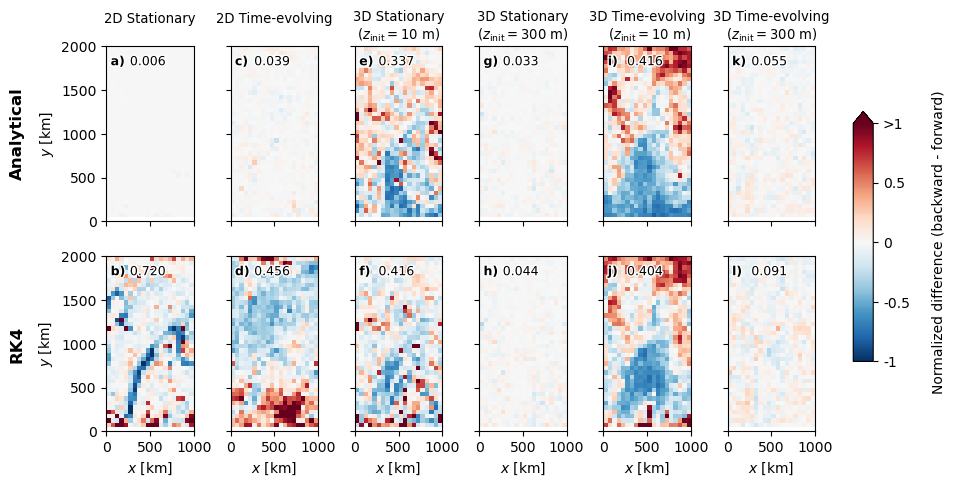

In [91]:
import matplotlib.patheffects as pe

fig, axes = plt.subplots(ncols=6, nrows=2, figsize=(10,5))

fig.subplots_adjust(right=0.85)

letter_labels = [["a)", "c)", "e)", "g)", "i)", "k)"], ["b)", "d)", "f)", "h)", "j)", "l)"]]

add_histogram_component(axes[0, 0], 'anal_2D_static')
add_histogram_component(axes[1, 0], 'RK4_2D_static_dt10_180d')
add_histogram_component(axes[0, 1], 'anal_2D_dynamic')
add_histogram_component(axes[1, 1], 'RK4_2D_dyn_dt10_180d')
add_histogram_component(axes[0, 2], 'anal_3D_static_z10')
add_histogram_component(axes[1, 2], 'RK4_3D_static_dt10_z10')
add_histogram_component(axes[0, 3], 'anal_3D_static_z300')
add_histogram_component(axes[1, 3], 'RK4_3D_static_dt10_z300')
add_histogram_component(axes[0, 4], 'anal_3D_dynamic_z10')
add_histogram_component(axes[1, 4], 'RK4_3D_dynamic_dt10_z10')
add_histogram_component(axes[0, 5], 'anal_3D_dynamic_z300')
counts = add_histogram_component(axes[1, 5], 'RK4_3D_dynamic_dt10_z300', returns=True)

runnames = [['anal_2D_static', 'anal_2D_dynamic', 'anal_3D_static_z10', 'anal_3D_static_z300', 'anal_3D_dynamic_z10', 'anal_3D_dynamic_z300'],
        ['RK4_2D_static_dt10_180d', 'RK4_2D_dyn_dt10_180d', 'RK4_3D_static_dt10_z10', 'RK4_3D_static_dt10_z300', 'RK4_3D_dynamic_dt10_z10', 'RK4_3D_dynamic_dt10_z300']]

row_names = ["Analytical", "RK4"]
column_names = ["2D Stationary\n ", "2D Time-evolving\n ", "3D Stationary\n"+r"($z_\text{init}=10$ m)", "3D Stationary\n"+r"($z_\text{init}=300$ m)", "3D Time-evolving\n "+r"($z_\text{init}=10$ m)", "3D Time-evolving\n"+r"($z_\text{init}=300$ m)"]

cbar_ax = fig.add_axes([0.88, 0.25, 0.02, 0.5]) 
cbar = fig.colorbar(counts, cax=cbar_ax, label="\nNormalized difference (backward - forward)", extend='max', ticks=[-1, -0.5, 0, 0.5, 1])
cbar.ax.set_yticklabels(['-1', '-0.5', '0', '0.5', '>1'])

for row_idx, row in enumerate(axes):
    for col_idx, ax in enumerate(row):
        ax.text(0.05, 0.95, letter_labels[row_idx][col_idx], transform=ax.transAxes, fontsize=9, color='black', fontweight='bold', path_effects=[pe.withStroke(linewidth=2, foreground='white')], va='top')
        ax.text(0.27, 0.95, f"{compute_RMSE(runnames[row_idx][col_idx]):.3f}", transform=ax.transAxes, fontsize=9, color='black', path_effects=[pe.withStroke(linewidth=2, foreground='white')], va='top')
        ax.set_aspect(1)
        if row_idx == 1:
            ax.set_xlabel("$x$ [km]")
        else:
            ax.set_xticklabels([])
        if col_idx == 0:
            ax.set_ylabel("$y$ [km]")
        else:
            ax.set_yticklabels([])
    
pad = 5
for ax, column_name in zip(axes[0], column_names):
    ax.annotate(column_name, xy=(0.5, 1), xytext=(0, pad),
                xycoords='axes fraction', textcoords='offset points',
                size=9.5, ha='center', va='baseline')

for ax, row_name in zip(axes[:,0], row_names):
    ax.annotate(row_name, xy=(0, 0.5), xytext=(-ax.yaxis.labelpad - pad, 0),
                xycoords=ax.yaxis.label, textcoords='offset points',
                size='large', ha='right', va='center', rotation=90, fontweight='bold')
# plt.tight_layout()
plt.savefig("figures/histograms/histograms.pdf", bbox_inches='tight')

# FTLE

Code from https://github.com/OceanParcels/Lagrangian_diags/blob/main/Diagnostics/FTLE_method.ipynb

In [92]:
import numpy.linalg as LA

def ftle_brunton_2009(J, Td):
    # http://cwrowley.princeton.edu/papers/BruntonChaos09.pdf
    D = np.dot(np.transpose(J), J)  # Cauchy–Green strain tensor
    lamda = LA.eigvals(D)
    lam_max = max(lamda)
    ftle = (1/Td)*np.log(np.sqrt(lam_max))
    return ftle

In [93]:
def displacement(x1, x2, y1, y2):
    return np.sqrt((x2 - x1)**2 + (y2 - y1)**2)

In [94]:
def compute_ftle(x0, y0, x1, y1, Td):
    """Compute Finite-time Lyaponov Exponent function from locations of Lagrangian trajectories at the intial and a later timestep

    Parameters
    ----------
    x0: meshgrid of initial longitude points
    y0: meshgrid of initial latitude points 
    x1: meshgrid of final longitude points
    y1: meshgrid of final latitude points 
    Td : number of days between inital and final timestamps 

    Returns
    -------
    2D array
    Computed FTLE for the whole set of points
    """
    H = x0.shape[0]
    L = x1.shape[1]

    FTLE_f = np.ones_like(np.asarray(x0))
    FTLE_f[:, :] = np.NaN

    J = np.empty([2, 2], float)

    # 1, H-1 --> to ignore bordersx for now
    for i in tqdm.tqdm(range(1, H - 1)):  # 0, H-2
        for j in range(1, L - 1):  # 0, L-2
            J[:, :] = np.NaN
            ls = np.array((x0[i, j], y0[i, j],
                           x0[i - 1, j], y0[i - 1, j],
                           x0[i, j - 1], y0[i, j - 1],
                           x0[i, j + 1], y0[i, j + 1],
                           x0[i + 1, j], y0[i + 1, j],
                           x1[i, j], y1[i, j],
                           x1[i - 1, j], y1[i - 1, j],
                           x1[i, j - 1], y1[i, j - 1],
                           x1[i, j + 1], y1[i, j + 1],
                           x1[i + 1, j], y1[i + 1, j]))
            if np.isnan(ls).any():
                continue

            J[0][0] = displacement(x1[i, j], x1[i - 1, j], y1[i, j], y1[i - 1, j]) / \
                displacement(x0[i, j], x0[i - 1, j], y0[i, j], y0[i - 1, j])
            J[0][1] = displacement(x1[i, j], x1[i, j - 1], y1[i, j], y1[i, j - 1]) / \
                displacement(x0[i, j], x0[i, j - 1], y0[i, j], y0[i, j - 1])
            J[1][0] = displacement(x1[i, j], x1[i, j + 1], y1[i, j], y1[i, j + 1]) / \
                displacement(x0[i, j], x0[i, j + 1], y0[i, j], y0[i, j + 1])
            J[1][1] = displacement(x1[i, j], x1[i + 1, j], y1[i, j], y1[i + 1, j]) / \
                displacement(x0[i, j], x0[i + 1, j], y0[i, j], y0[i + 1, j])
            f_value = ftle_brunton_2009(J, Td)
            FTLE_f[i][j] = f_value

    print(np.nanmin(FTLE_f), np.nanmax(FTLE_f))
    return FTLE_f

In [95]:
dx = dy = 5_000
refinement = 2
x_grid = np.arange(0 + dx/refinement/2, 1_000_000, dx/refinement)
y_grid = np.arange(50000 + dx/refinement/2, 2_000_000, dx/refinement)
XX_grid, YY_grid = np.meshgrid(x_grid, y_grid)

In [96]:
def compute_ftle_auto(exp, Td=15, mode='forward'):
    if mode == 'backw':
        exp += '_backw'
    FTLE = compute_ftle(x0=res[exp].X.isel(obs=0).values.reshape(XX_grid.shape), 
                       y0=res[exp].Y.isel(obs=0).values.reshape(XX_grid.shape),
                       x1=res[exp].X.isel(obs=Td).values.reshape(XX_grid.shape),
                          y1=res[exp].Y.isel(obs=Td).values.reshape(XX_grid.shape),
                            Td=Td)
    return FTLE

In [97]:
FTLE_15_RK4_stat = compute_ftle_auto('RK4_2D_static_dt10_180d')
FTLE_15_RK4_stat_backw = compute_ftle_auto('RK4_2D_static_dt10_180d_backw_from_t0')

FTLE_15_anal_stat = compute_ftle_auto('anal_2D_static')


100%|██████████| 778/778 [00:13<00:00, 57.32it/s]


-0.5529642310436463 0.4100200709436361


100%|██████████| 778/778 [00:13<00:00, 58.27it/s]


-0.7798490417579805 0.4198814556328852


100%|██████████| 778/778 [00:13<00:00, 58.13it/s]

-0.5537352073578816 0.4100264732524733


In [98]:
FTLE_180_RK4_stat = compute_ftle_auto('RK4_2D_static_dt10_180d', Td=180)
FTLE_180_anal_stat = compute_ftle_auto('anal_2D_static', Td=180)
FTLE_180_RK4_stat_backw = compute_ftle_auto('RK4_2D_static_dt10_180d_backw_from_t0', Td=180)
FTLE_180_anal_stat_backw = compute_ftle_auto('anal_2D_static_backw_from_t0', Td=180)

  0%|          | 0/778 [00:00<?, ?it/s]/tmp/ipykernel_3573/714084839.py:8: RuntimeWarning: divide by zero encountered in log
  ftle = (1/Td)*np.log(np.sqrt(lam_max))
100%|██████████| 778/778 [00:13<00:00, 57.41it/s]


-inf 0.04266237841460611


100%|██████████| 778/778 [00:12<00:00, 62.33it/s]


-inf 0.04239034503741983


100%|██████████| 778/778 [00:13<00:00, 58.24it/s]


-inf 0.04320894749913804


100%|██████████| 778/778 [00:10<00:00, 72.40it/s]

-inf 0.04320970481519597


In [99]:
def finite_fill(arr):
    arr[~np.isfinite(arr)] = 0
    return arr

/tmp/ipykernel_3573/2087502632.py:11: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax[i].set_xticklabels((ax[i].get_xticks()/1000).astype(int))
/tmp/ipykernel_3573/2087502632.py:12: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax[i].set_yticklabels((ax[i].get_yticks()/1000).astype(int))
/tmp/ipykernel_3573/2087502632.py:11: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax[i].set_xticklabels((ax[i].get_xticks()/1000).astype(int))
/tmp/ipykernel_3573/2087502632.py:12: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax[i].set_yticklabels((ax[i].get_yticks()/1000).astype(int))


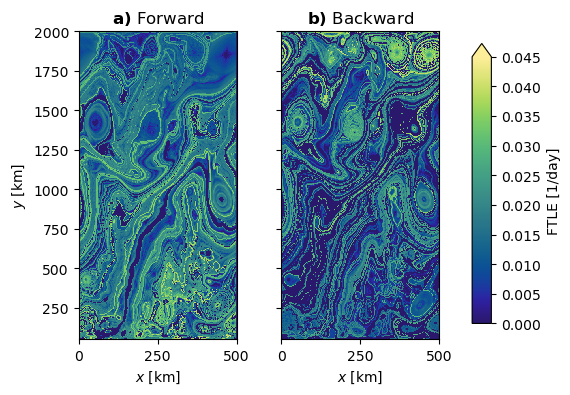

In [100]:
fig, ax = plt.subplots(ncols=2, nrows=1, figsize=(5.5, 4))

fields = [finite_fill(FTLE_180_anal_stat), finite_fill(FTLE_180_anal_stat_backw)]
titles = [r"$\bf{a)}$ Forward", r"$\bf{b)}$ Backward"]  

for i, field in enumerate(fields):
    im = ax[i].pcolormesh(x_grid, y_grid, field, cmap=cm.cm.haline, vmin=0.0, vmax=0.045)
    # ax[i].contour(x_grid, y_grid, field, levels=[0.2], colors='black', linewidths=0.5)
    ax[i].set_title(titles[i])
    ax[i].set_aspect(1)
    ax[i].set_xticklabels((ax[i].get_xticks()/1000).astype(int))
    ax[i].set_yticklabels((ax[i].get_yticks()/1000).astype(int))
    ax[i].set_xlabel("$x$ [km]")
    if i == 0:
        ax[i].set_ylabel("$y$ [km]")
    else:
        ax[i].set_yticklabels([])

# Add space for colorbar
fig.subplots_adjust(right=0.8)
cbar_ax = fig.add_axes([0.85, 0.15, 0.035, 0.7])
fig.colorbar(im, cax=cbar_ax, label="FTLE [1/day]", extend='max')

# plt.savefig("figures/ftle_2D_static.png", dpi=300, bbox_inches='tight')
plt.show()

/tmp/ipykernel_3573/1107801619.py:11: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax[i].set_xticklabels((ax[i].get_xticks()/1000).astype(int))
/tmp/ipykernel_3573/1107801619.py:12: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax[i].set_yticklabels((ax[i].get_yticks()/1000).astype(int))
/tmp/ipykernel_3573/1107801619.py:11: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax[i].set_xticklabels((ax[i].get_xticks()/1000).astype(int))
/tmp/ipykernel_3573/1107801619.py:12: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax[i].set_yticklabels((ax[i].get_yticks()/1000).astype(int))


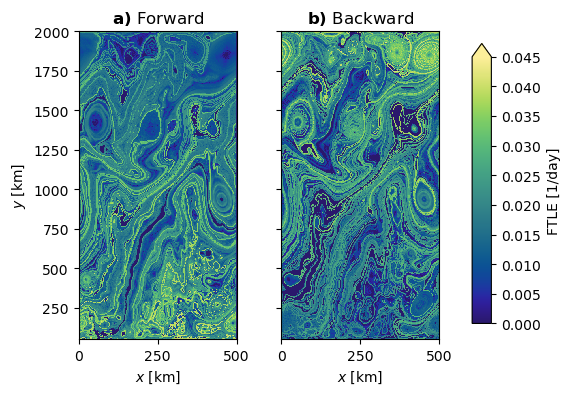

In [101]:
fig, ax = plt.subplots(ncols=2, nrows=1, figsize=(5.5, 4))

fields = [finite_fill(FTLE_180_RK4_stat), finite_fill(FTLE_180_RK4_stat_backw)]
titles = [r"$\bf{a)}$ Forward", r"$\bf{b)}$ Backward"]  

for i, field in enumerate(fields):
    im = ax[i].pcolormesh(x_grid, y_grid, field, cmap=cm.cm.haline, vmin=0.0, vmax=0.045)
    # ax[i].contour(x_grid, y_grid, field, levels=[0.2], colors='black', linewidths=0.5)
    ax[i].set_title(titles[i])
    ax[i].set_aspect(1)
    ax[i].set_xticklabels((ax[i].get_xticks()/1000).astype(int))
    ax[i].set_yticklabels((ax[i].get_yticks()/1000).astype(int))
    ax[i].set_xlabel("$x$ [km]")
    if i == 0:
        ax[i].set_ylabel("$y$ [km]")
    else:
        ax[i].set_yticklabels([])

# Add space for colorbar
fig.subplots_adjust(right=0.8)
cbar_ax = fig.add_axes([0.85, 0.15, 0.035, 0.7])
fig.colorbar(im, cax=cbar_ax, label="FTLE [1/day]", extend='max')

plt.savefig("figures/ftle_2D_static.png", dpi=300, bbox_inches='tight')
plt.show()

/tmp/ipykernel_3573/4041238619.py:16: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  axes[i, j].set_xticklabels((axes[i, j].get_xticks()/500).astype(int))
/tmp/ipykernel_3573/4041238619.py:17: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  axes[i, j].set_yticklabels((axes[i, j].get_yticks()/1000).astype(int))
/tmp/ipykernel_3573/4041238619.py:16: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  axes[i, j].set_xticklabels((axes[i, j].get_xticks()/500).astype(int))
/tmp/ipykernel_3573/4041238619.py:17: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  axes[i, j].set_yticklabels((axes[i, j].get_yticks()/1000).astype(int))
/tmp/ipykernel_3573/4041238619.py:16: UserWarn

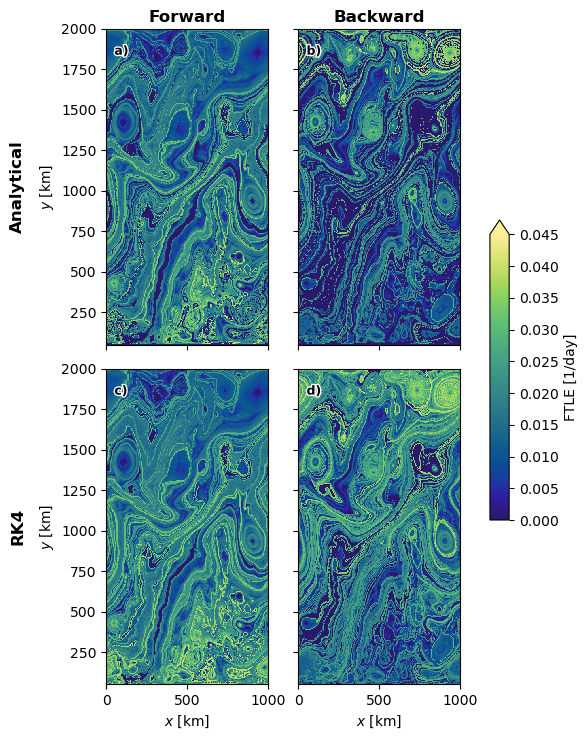

In [102]:
fig, axes = plt.subplots(ncols=2, nrows=2, figsize=(5.5, 7.5))

fields = [[finite_fill(FTLE_180_anal_stat), finite_fill(FTLE_180_anal_stat_backw)],
    [finite_fill(FTLE_180_RK4_stat), finite_fill(FTLE_180_RK4_stat_backw)]]
letter_labels = [["a)", "b)"], ["c)", "d)"]]
# titles = [r"$\bf{a)}$ Forward", r"$\bf{b)}$ Backward"]  
column_names = ["Forward", "Backward"]
row_names = ["Analytical", "RK4"]

for i in range(2):
    for j in range(2):
        im = axes[i, j].pcolormesh(x_grid, y_grid, fields[i][j], cmap=cm.cm.haline, vmin=0.0, vmax=0.045)
        axes[i, j].text(0.05, 0.95, letter_labels[i][j], transform=axes[i,j].transAxes, fontsize=9, color='black', fontweight='bold', path_effects=[pe.withStroke(linewidth=2, foreground='white')], va='top')
        axes[i, j].set_aspect(1)
        axes[i, j].set_xlim(0, 1000_000)
        axes[i, j].set_xticklabels((axes[i, j].get_xticks()/500).astype(int))
        axes[i, j].set_yticklabels((axes[i, j].get_yticks()/1000).astype(int))
        if j == 0:
            axes[i, j].set_ylabel("$y$ [km]")
        else:
            axes[i, j].set_yticklabels([])
        if i == 1:
            axes[i, j].set_xlabel("$x$ [km]")
        else:
            axes[i, j].set_xticklabels([])
 

for ax, column_name in zip(axes[0], column_names):
    ax.annotate(column_name, xy=(0.5, 1), xytext=(0, pad),
                xycoords='axes fraction', textcoords='offset points', ha='center', va='baseline', fontweight='bold', size='large')

for ax, row_name in zip(axes[:,0], row_names):
    ax.annotate(row_name, xy=(0, 0.5), xytext=(-ax.yaxis.labelpad - pad, 0),
                xycoords=ax.yaxis.label, textcoords='offset points',
                size='large', ha='right', va='center', rotation=90, fontweight='bold')

fig.tight_layout(h_pad=1, w_pad=5)
# Add space for colorbar
fig.subplots_adjust(right=0.8)
cbar_ax = fig.add_axes([0.85, 0.3, 0.035, 0.4])
fig.colorbar(im, cax=cbar_ax, label="FTLE [1/day]", extend='max')

plt.savefig("figures/ftle_2D_static_all.png", dpi=300, bbox_inches='tight')
plt.show()

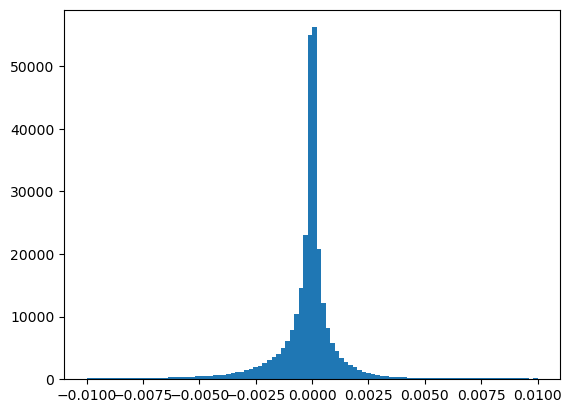

Text(0.5, 1.0, 'Difference between analytical and RK4 FTLE')

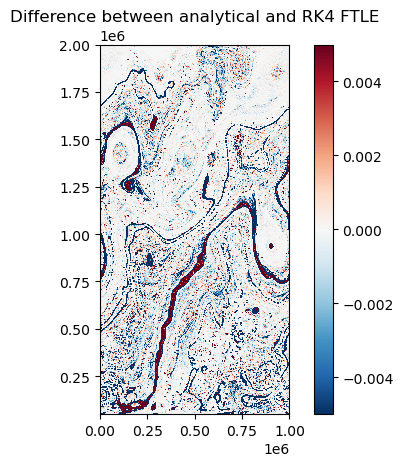

In [104]:
plt.hist((FTLE_180_anal_stat-FTLE_180_RK4_stat).flatten(), bins=100, range=(-0.01, 0.01))
plt.show()
plt.pcolormesh(x_grid, y_grid, FTLE_180_anal_stat-FTLE_180_RK4_stat, cmap='RdBu_r', vmin=-0.005, vmax=0.005)
# set aspect to be equal
plt.gca().set_aspect('equal', adjustable='box')
plt.colorbar()
plt.title("Difference between analytical and RK4 FTLE")

# Histograms

In [105]:
surface_div = (ds_derivatives.dUdX.isel(Z=0, time=0)/5000 + ds_derivatives.dVdY.isel(Z=0, time=0)/5000)

In [106]:
z10_div = (ds_derivatives.dUdX.isel(time=0)/5000 + ds_derivatives.dVdY.isel(time=0)/5000).interp(Z=-10, method='linear')
z300_div = (ds_derivatives.dUdX.isel(time=0)/5000 + ds_derivatives.dVdY.isel(time=0)/5000).interp(Z=-300, method='linear')

In [107]:
def plot_histogram_correlation(expname, corrquant, corr_quant_name, bins, title=None, save=False, reverse=True):
    if type(expname) == str:
        expname_forward = expname
        expname_backward = expname + "_backw"
    elif type(expname) == tuple:
        expname_forward = expname[0]
        expname_backward = expname[1]
    else:
        raise ValueError("expname must be a string or a tuple of strings")

    mask = np.isfinite(res[expname_forward].isel(obs=-1).X)

    init_div = corrquant.interp(XC = res[expname_forward].isel(obs=0).X[mask] % 1_000_000, YC = res[expname_forward].isel(obs=0).Y[mask])
    backw_div = corrquant.interp(XC = res[expname_backward].isel(obs=-1).X[mask]% 1_000_000, YC = res[expname_backward].isel(obs=-1).Y[mask])

    binwidth = bins[1] - bins[0]
    fig, ax = plt.subplots(nrows=2, figsize=(4,3.5), height_ratios=(1.6, 1))

    hist_2d_forward, bins = np.histogram(init_div, bins=bins, density=False)
    hist_2d_backward, bins = np.histogram(backw_div, bins=bins, density=False)

    if reverse:
        ax[0].bar(bins[:-1], hist_2d_forward, width=binwidth, alpha=0.5, label='Backward', align='edge')
        ax[0].bar(bins[:-1], hist_2d_backward, width=binwidth, alpha=0.5, label='Forward', align='edge')
    else:
        ax[0].bar(bins[:-1], hist_2d_forward, width=binwidth, alpha=0.5, label='Forward', align='edge')
        ax[0].bar(bins[:-1], hist_2d_backward, width=binwidth, alpha=0.5, label='Backward', align='edge')
    ax[0].legend()
    ax[0].set_ylabel("# particles")

    if reverse:
        ax[1].bar(bins[:-1], hist_2d_backward-hist_2d_forward, width=binwidth, align='edge')
        ax[1].set_ylabel("Backward - Forward")
    else:
        ax[1].bar(bins[:-1], hist_2d_forward-hist_2d_backward, width=binwidth, align='edge')
        ax[1].set_ylabel("Forward - Backward")

    ax[1].set_xlabel(corr_quant_name)
    if title is not None:
        ax[0].set_title(title)
    else:
        ax[0].set_title(expname_forward)
    
    if save:
        plt.savefig(f"figures/divergence_histograms/divergence_histogram_{expname_forward}_{corr_quant_name}.pdf", bbox_inches='tight')

    plt.show()


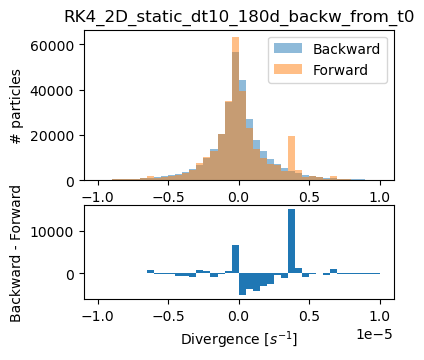

In [108]:
plot_histogram_correlation(('RK4_2D_static_dt10_180d_backw_from_t0', 'RK4_2D_static_dt10_forward_from_backw_from_t0'), surface_divergence.isel(time=0), "Divergence [$s^{-1}$]", np.arange(-1e-5, 1e-5, 5e-7), save=True, reverse=True)

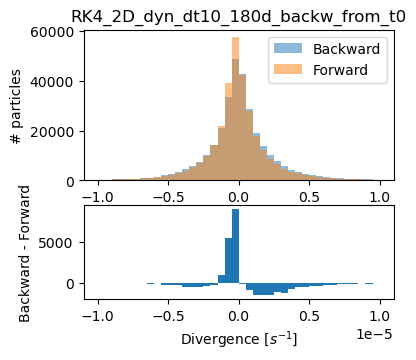

In [109]:
plot_histogram_correlation(('RK4_2D_dyn_dt10_180d_backw_from_t0', 'RK4_2D_dyn_dt10_forward_from_backw_from_t0'), surface_divergence.isel(time=-1), "Divergence [$s^{-1}$]", np.arange(-1e-5, 1e-5, 5e-7), save=True, reverse=True)

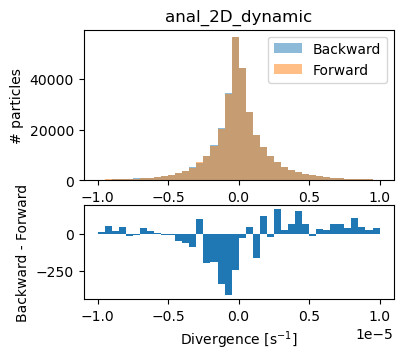

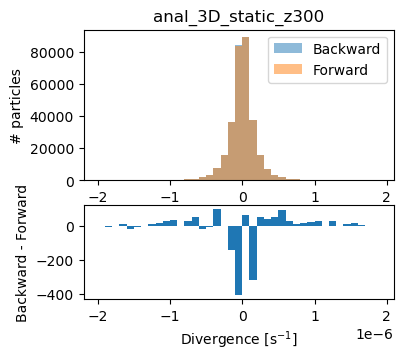

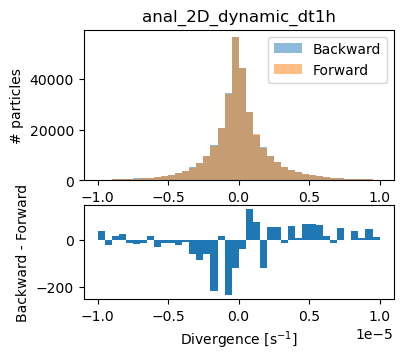

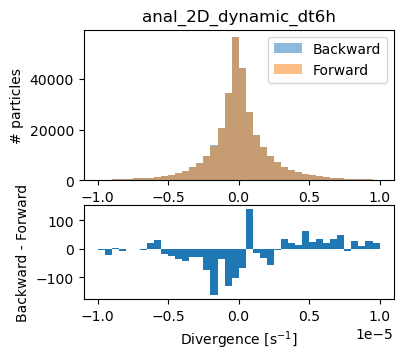

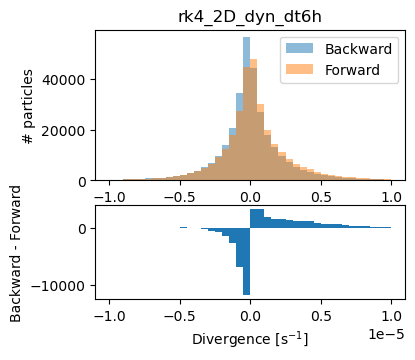

...

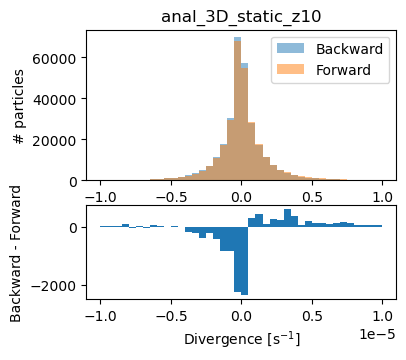

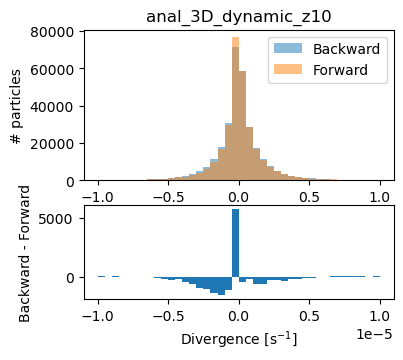

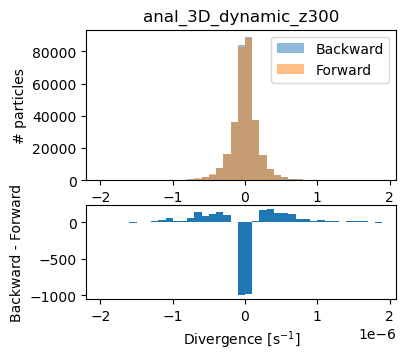

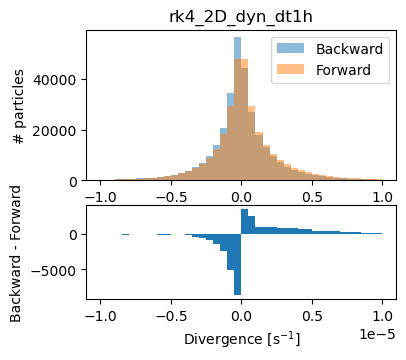

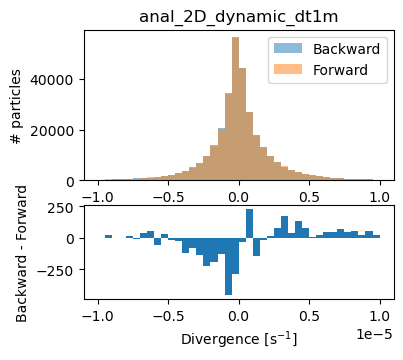

In [110]:
for run in qc_runs:
    if 'z10' in run:
        divergence = z10_div
        bins = np.arange(-1e-5, 1e-5, 5e-7)
    elif 'z300' in run:
        divergence = z300_div
        bins = np.arange(-2e-6, 2e-6, 1e-7)
    else:
        bins = np.arange(-1e-5, 1e-5, 5e-7)
        divergence = surface_div
    plot_histogram_correlation(run, divergence, "Divergence [s$^{-1}$]", bins=bins, title=None, save=True)

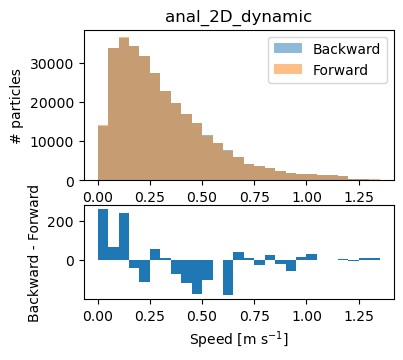

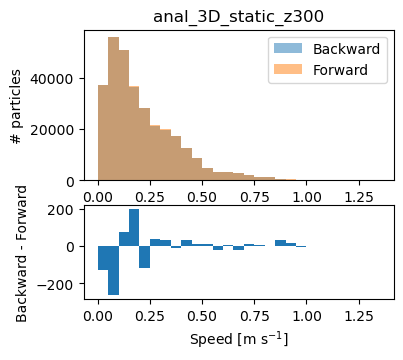

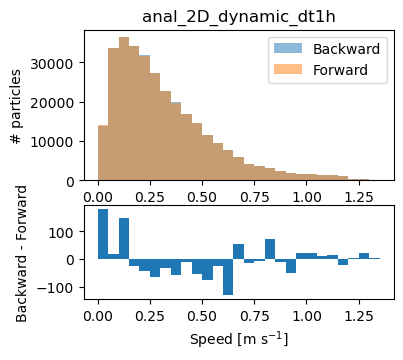

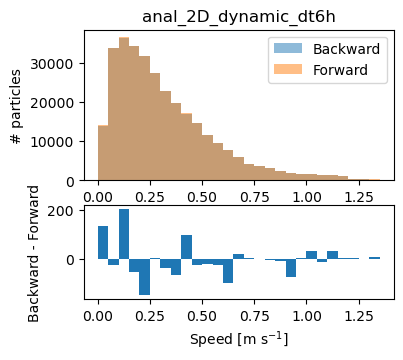

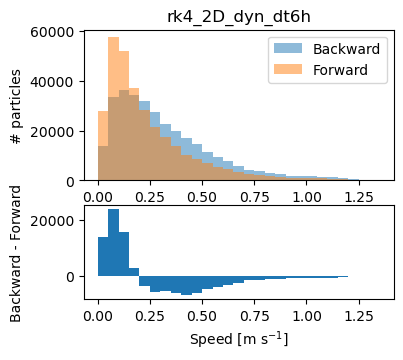

...

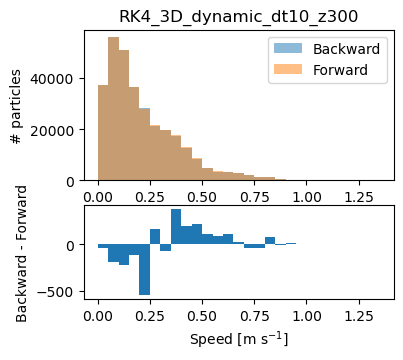

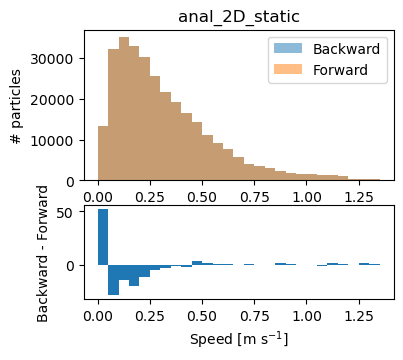

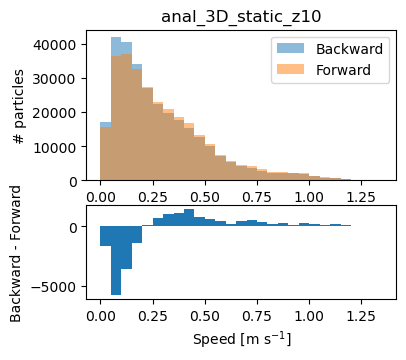

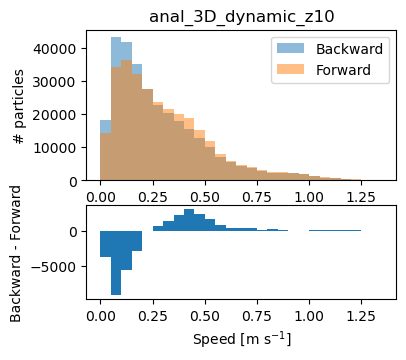

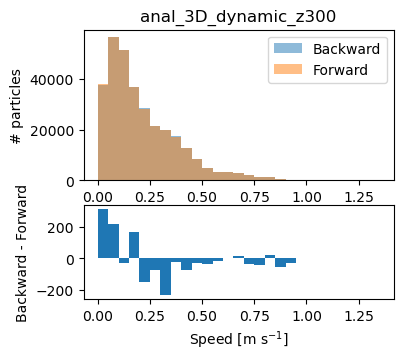

KeyboardInterrupt: 

In [111]:
for run in qc_runs:
    if 'z10' in run:
        speed = ds_derivatives.speed.isel(time=0).interp(Z=-10, method='linear')
    elif 'z300' in run:
        speed = ds_derivatives.speed.isel(time=0).interp(Z=-300, method='linear')
    else:
        speed = ds_derivatives.speed.isel(Z=0, time=0)
    plot_histogram_correlation(run, speed, "Speed [m s$^{-1}$]", bins=np.arange(0, 1.4, 0.05))

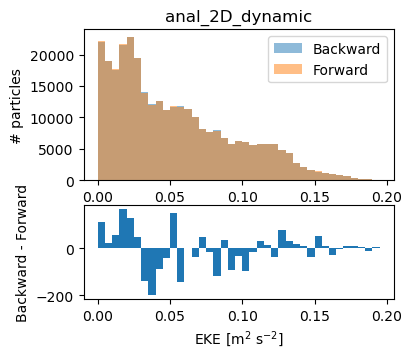

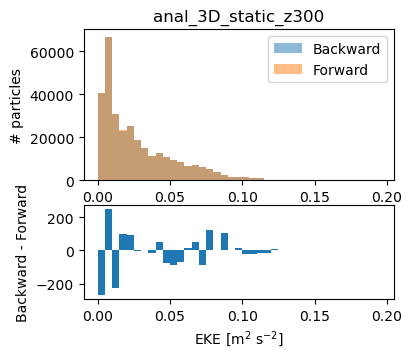

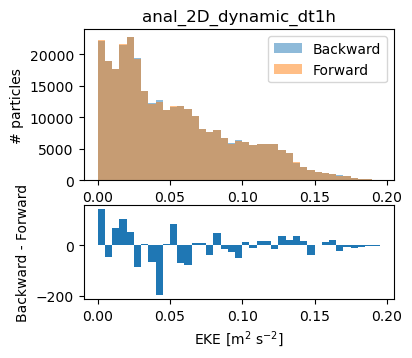

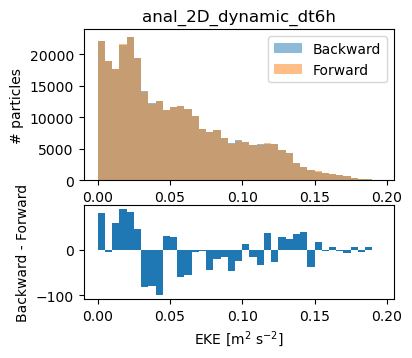

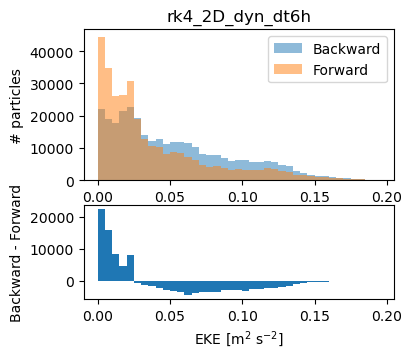

...

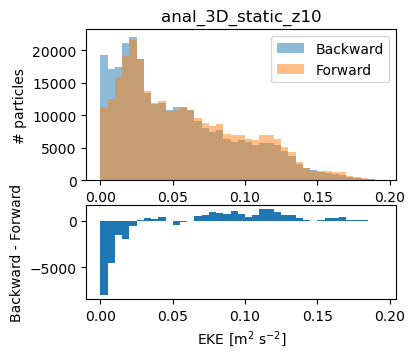

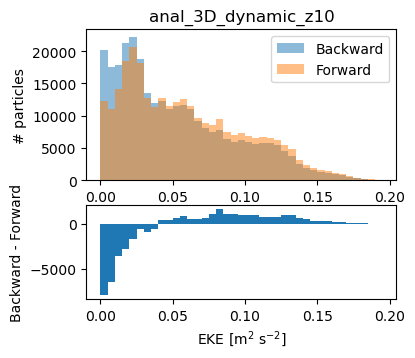

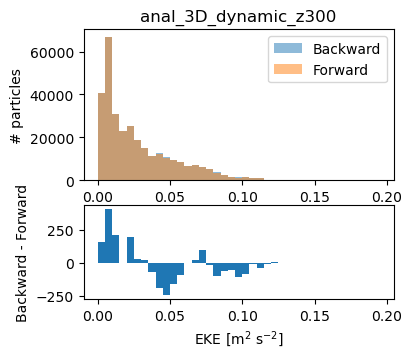

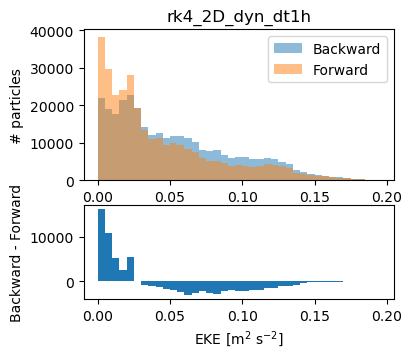

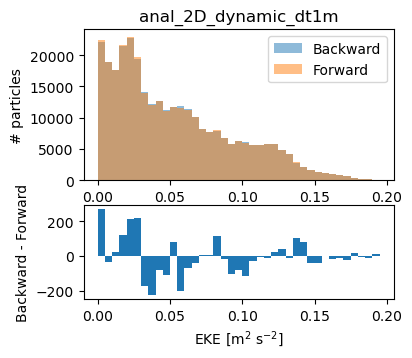

In [ ]:
for run in qc_runs:
    if 'z10' in run:
        EKE = ds_energy.EKE.interp(Z=-10, method='linear')
    elif 'z300' in run:
        EKE = ds_energy.EKE.interp(Z=-300, method='linear')
    else:
        EKE = ds_energy.EKE.isel(Z=0)
    plot_histogram_correlation(run, EKE, "EKE [m$^2$ s$^{-2}$]", bins=np.arange(0, 0.2, 0.005))

# Combination figures

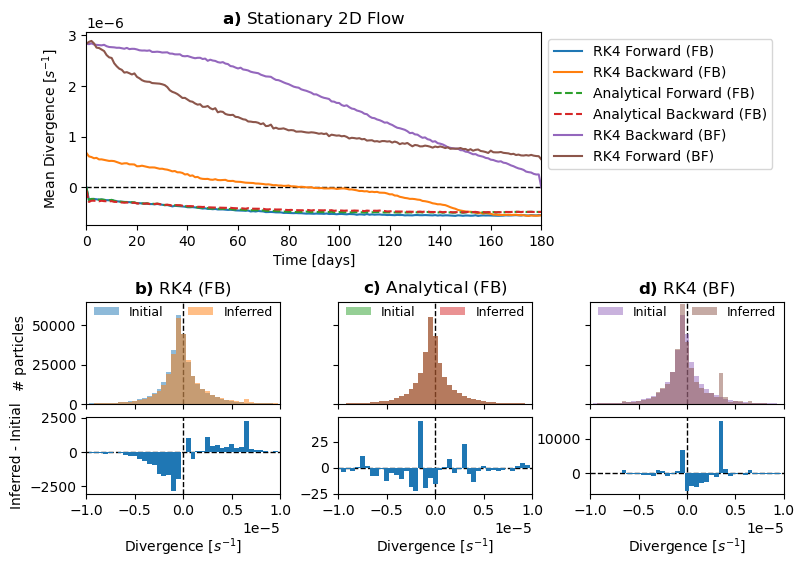

In [ ]:
fig = plt.figure(figsize=(9, 6))

gs_outer = fig.add_gridspec(2, 1, hspace=0.4, height_ratios=[1,1])
gs_top = gs_outer[0].subgridspec(1, 2, wspace=0, width_ratios=[3, 1.6])
gs_bottom = gs_outer[1].subgridspec(2, 3, wspace=0.3, hspace=0.15, width_ratios=[1, 1, 1], height_ratios=[2, 1.5])

# Top plot
ax_top = fig.add_subplot(gs_top[0])
res['RK4_2D_static_dt10_180d']['divergence'].mean('trajectory').plot(ax=ax_top, label="RK4 Forward (FB)")
res['RK4_2D_static_dt10_180d_backw']['divergence'].mean('trajectory')[::-1].plot(ax=ax_top, label="RK4 Backward (FB)")

res['anal_2D_static']['divergence'].mean('trajectory').plot(ax=ax_top, label="Analytical Forward (FB)", linestyle='--')
res['anal_2D_static_backw']['divergence'].mean('trajectory')[::-1].plot(ax=ax_top, label="Analytical Backward (FB)", linestyle='--')

res['RK4_2D_static_dt10_180d_backw_from_t0']['divergence'].mean('trajectory')[::-1].plot(ax=ax_top, label="RK4 Backward (BF)")
res['RK4_2D_static_dt10_forward_from_backw_from_t0']['divergence'].mean('trajectory').plot(ax=ax_top, label="RK4 Forward (BF)")

ax_top.set_xlabel('Time [days]')
ax_top.set_ylabel('Mean Divergence [$s^{-1}$]')

ax_top.legend(loc='upper left', bbox_to_anchor=(1, 1))
ax_top.axhline(0, color='black', linewidth=1, linestyle='--', zorder=0)
ax_top.set_xlim(0, 180)

# ax_top.text(0.025, 1.25, "a)", transform=ax_top.transAxes, fontsize=11, color='black', fontweight='bold', va='top')
ax_top.set_title(r"$\bf{a)}$ Stationary 2D Flow")

ax_tr_pad = fig.add_subplot(gs_top[1])
ax_tr_pad.axis('off')

# Bottom plot
def div_hist(expname, corrquant, bins=np.arange(-1e-5, 1e-5, 5e-7)):
    if type(expname) == str:
        expname_forward = expname
        expname_backward = expname + "_backw"
    elif type(expname) == tuple:
        expname_forward = expname[0]
        expname_backward = expname[1]
    else:
        raise ValueError("expname must be a string or a tuple of strings")

    mask = np.isfinite(res[expname_forward].isel(obs=-1).X)

    init_div = corrquant.interp(XC = res[expname_forward].isel(obs=0).X[mask] % 1_000_000, YC = res[expname_forward].isel(obs=0).Y[mask])
    reverse_div = corrquant.interp(XC = res[expname_backward].isel(obs=-1).X[mask]% 1_000_000, YC = res[expname_backward].isel(obs=-1).Y[mask])

    hist_2d_init, bins = np.histogram(init_div, bins=bins, density=False)
    hist_2d_reverse, bins = np.histogram(reverse_div, bins=bins, density=False)
    return hist_2d_init, hist_2d_reverse

# bins = np.arange(-1e-5, 1e-5, 5e-7)
bins = np.arange(-1e-5 - 2.5e-7, 1e-5 + 2.5e-7, 5e-7)
binwidth = bins[1] - bins[0]

hist_2d_fb_rk4_stat_init, hist_2d_fb_rk4_stat_reverse = div_hist('RK4_2D_static_dt10_180d', surface_divergence.isel(time=0))
hist_2d_fb_anal_stat_init, hist_2d_fb_anal_stat_reverse = div_hist('anal_2D_static', surface_divergence.isel(time=0))
hist_2d_bf_rk4_stat_init, hist_2d_bf_rk4_stat_reverse = div_hist(('RK4_2D_static_dt10_180d_backw_from_t0', 'RK4_2D_static_dt10_forward_from_backw_from_t0') , surface_divergence.isel(time=0))

histogram_data = [
    (hist_2d_fb_rk4_stat_init, hist_2d_fb_rk4_stat_reverse, r"$\bf{b)}$ RK4 (FB)"),
    (hist_2d_fb_anal_stat_init, hist_2d_fb_anal_stat_reverse, r"$\bf{c)}$ Analytical (FB)"),
    (hist_2d_bf_rk4_stat_init, hist_2d_bf_rk4_stat_reverse, r"$\bf{d)}$ RK4 (BF)")
]

hist_colors = [['C0', 'C1'], ['C2', 'C3'], ['C4', 'C5']]

for i, (hist_fw, hist_bw, title) in enumerate(histogram_data):
    ax = fig.add_subplot(gs_bottom[0, i]) 
    ax.bar(bins[:-1], hist_fw, width=binwidth, alpha=0.5, label='Initial', align='edge', color=hist_colors[i][0])
    ax.bar(bins[:-1], hist_bw, width=binwidth, alpha=0.5, label='Inferred', align='edge', color=hist_colors[i][1])
    ax.set_title(title)
    ax.axvline(0, color='black', linewidth=1, linestyle='--', zorder=0)
    ax.set_xlim(-1e-5, 1e-5)
    ax.set_xticks([-1e-5, -5e-6, 0, 5e-6, 1e-5])
    ax.set_xticklabels([])
    ax.set_ylim(0, 65000)
    if i == 0:
        ax.set_ylabel("# particles")
    else:
        ax.set_yticklabels([])
    # if i == 1:
    ax.legend(loc='center', bbox_to_anchor=(0.5, 0.9), ncols=2, fontsize=9, framealpha=0.3, frameon=False)
    
    ax = fig.add_subplot(gs_bottom[1, i])
    ax.bar(bins[:-1], hist_bw-hist_fw, width=binwidth, align='edge')
    ax.set_xlim(-1e-5, 1e-5)
    ax.axhline(0, color='black', linewidth=1, linestyle='--', zorder=0)
    ax.axvline(0, color='black', linewidth=1, linestyle='--', zorder=0)
    # ax.set_ylim(-62500, 62500)
    if i == 0:
        ax.set_ylabel("Inferred - Initial")
    ax.set_xlabel("Divergence [$s^{-1}$]")
    ax.set_xticks([-1e-5, -5e-6, 0, 5e-6, 1e-5])
    # place the x-axis label slightly below the plot
    ax.xaxis.set_label_coords(0.5, -0.55)

plt.savefig("figures/divergence_comparison_2D_stationary_w_hist.pdf", bbox_inches='tight')
plt.show()

In [ ]:
# matplotlib inline retina
%config InlineBackend.figure_format = 'retina'

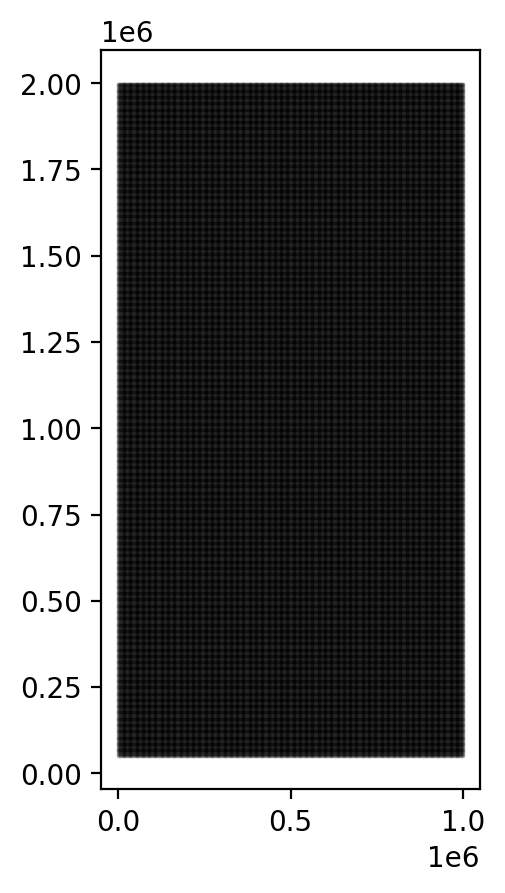

In [ ]:
plt.scatter(res['RK4_2D_static_dt10_180d_backw_from_t0'].isel(obs=0).X, res['RK4_2D_static_dt10_180d_backw_from_t0'].isel(obs=0).Y, c='black', s=0.1, alpha=0.2)
plt.gca().set_aspect(1)

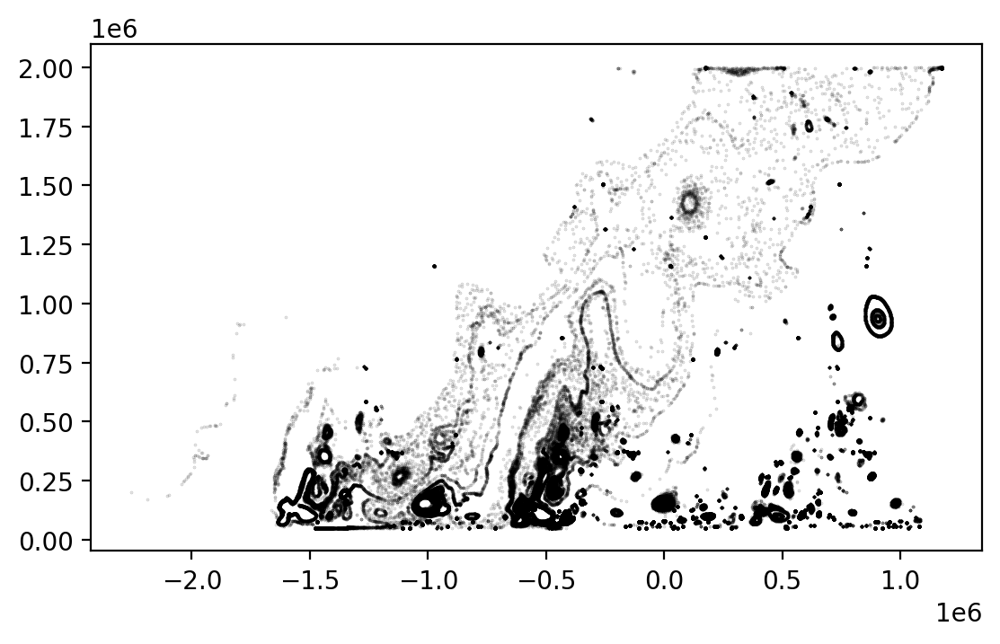

In [ ]:
plt.scatter(res['RK4_2D_static_dt10_180d_backw_from_t0'].isel(obs=-1).X, res['RK4_2D_static_dt10_180d_backw_from_t0'].isel(obs=-1).Y, c='black', s=0.1, alpha=0.2)
plt.gca().set_aspect(1)

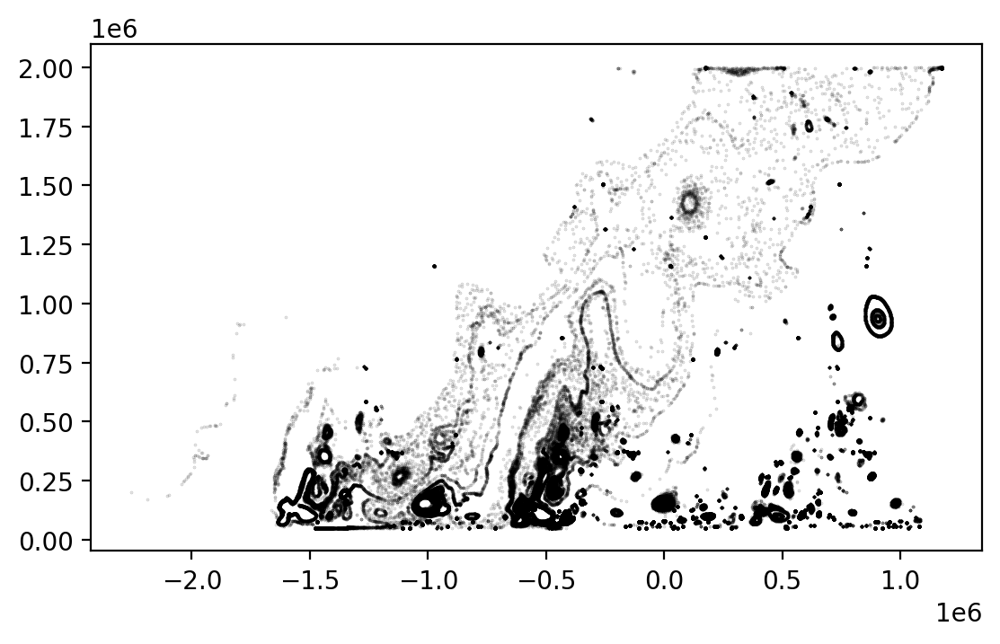

In [ ]:
plt.scatter(res['RK4_2D_static_dt10_forward_from_backw_from_t0'].isel(obs=0).X, res['RK4_2D_static_dt10_forward_from_backw_from_t0'].isel(obs=0).Y, c='black', s=0.1, alpha=0.2)
plt.gca().set_aspect(1)

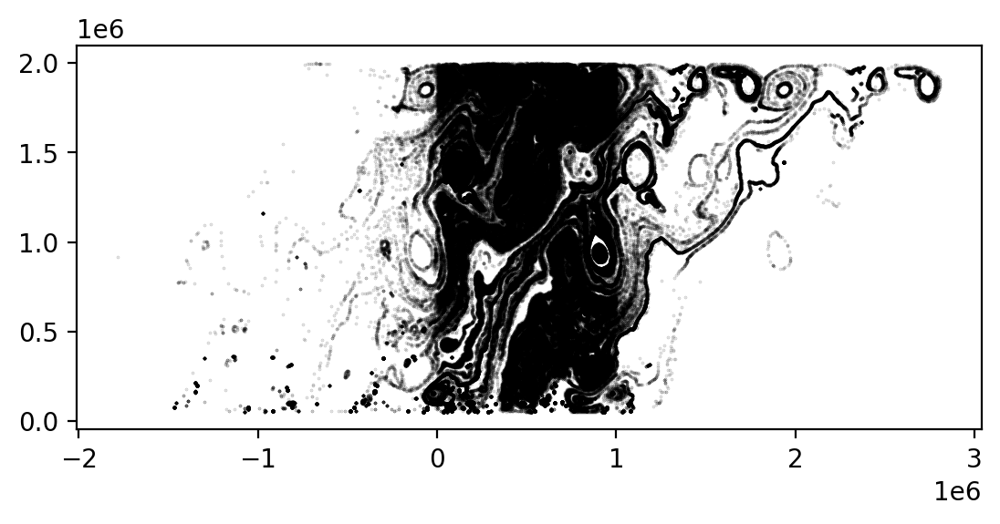

In [ ]:
plt.scatter(res['RK4_2D_static_dt10_forward_from_backw_from_t0'].isel(obs=-1).X, res['RK4_2D_static_dt10_forward_from_backw_from_t0'].isel(obs=-1).Y, c='black', s=0.1, alpha=0.2)
plt.gca().set_aspect(1)

In [ ]:
div_at_part = surface_divergence.isel(time=0).interp(XC = res['RK4_2D_static_dt10_forward_from_backw_from_t0'].isel(obs=-1).X% 1_000_000, YC = res['RK4_2D_static_dt10_forward_from_backw_from_t0'].isel(obs=-1).Y)

(array([ 1200.,  1124.,  2253.,  1108.,  1002.,  1179.,   854.,   779.,
          697.,   695., 14628.,   612.,  2780.,   880.,   517.,   508.,
         2834.,   442.,   401.,   381.,   332.,   332.,   327.,   281.,
          273.]),
 array([2.5e-06, 2.6e-06, 2.7e-06, 2.8e-06, 2.9e-06, 3.0e-06, 3.1e-06,
        3.2e-06, 3.3e-06, 3.4e-06, 3.5e-06, 3.6e-06, 3.7e-06, 3.8e-06,
        3.9e-06, 4.0e-06, 4.1e-06, 4.2e-06, 4.3e-06, 4.4e-06, 4.5e-06,
        4.6e-06, 4.7e-06, 4.8e-06, 4.9e-06, 5.0e-06]),
 <BarContainer object of 25 artists>)

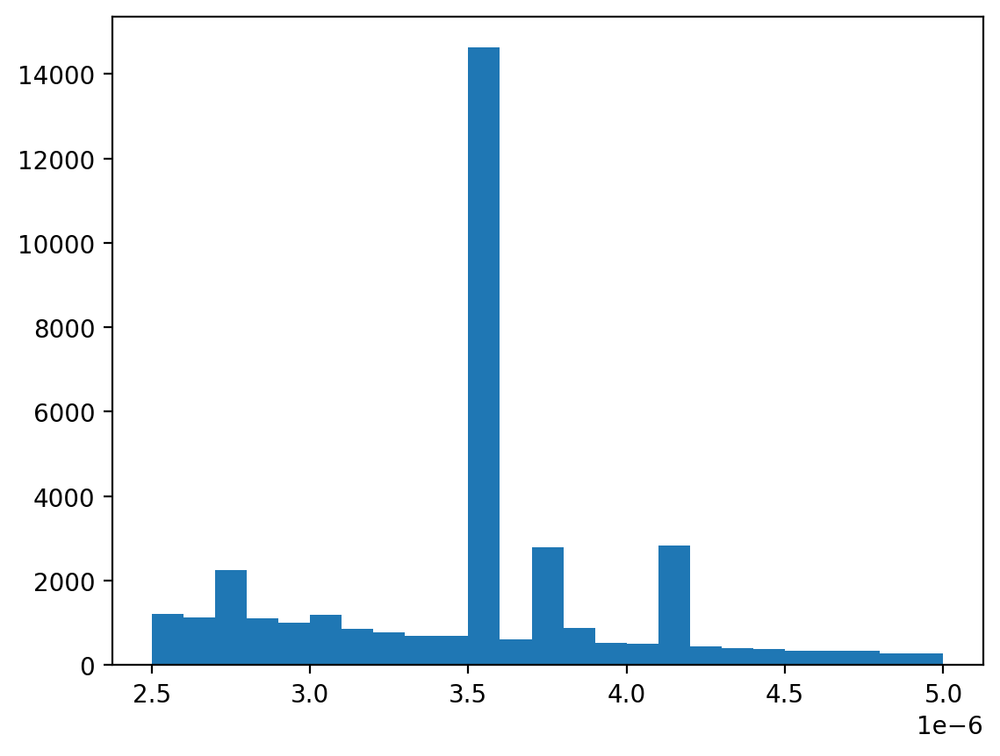

In [ ]:
plt.hist(div_at_part, bins=np.arange(0.25e-5, 0.5e-5, 1e-7))

In [ ]:
peak_mask = (div_at_part > 3.5e-6) & (div_at_part < 3.6e-6)

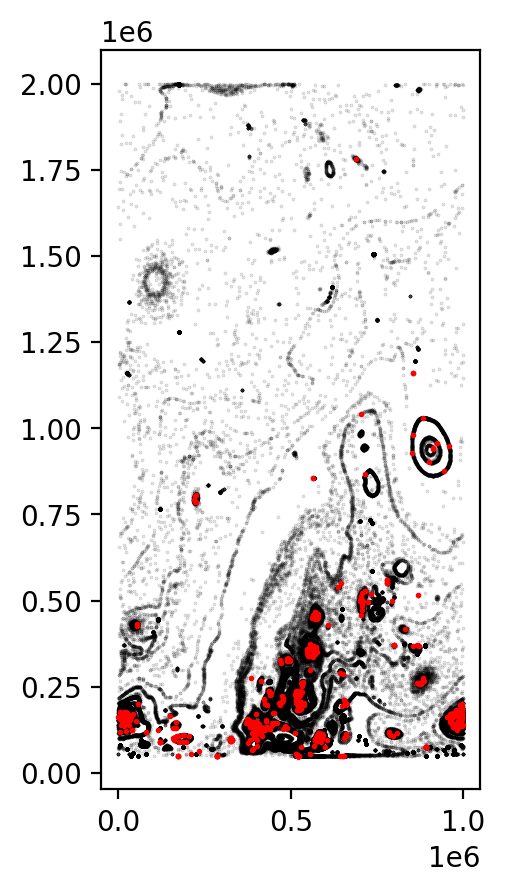

In [ ]:
plt.scatter(res['RK4_2D_static_dt10_forward_from_backw_from_t0'].isel(obs=0).X % 1_000_000, res['RK4_2D_static_dt10_forward_from_backw_from_t0'].isel(obs=0).Y, c='black', s=0.1, alpha=0.2)
plt.scatter(res['RK4_2D_static_dt10_forward_from_backw_from_t0'].isel(obs=0).X[peak_mask] % 1_000_000, res['RK4_2D_static_dt10_forward_from_backw_from_t0'].isel(obs=0).Y[peak_mask], c='red', s=1)
plt.gca().set_aspect(1)

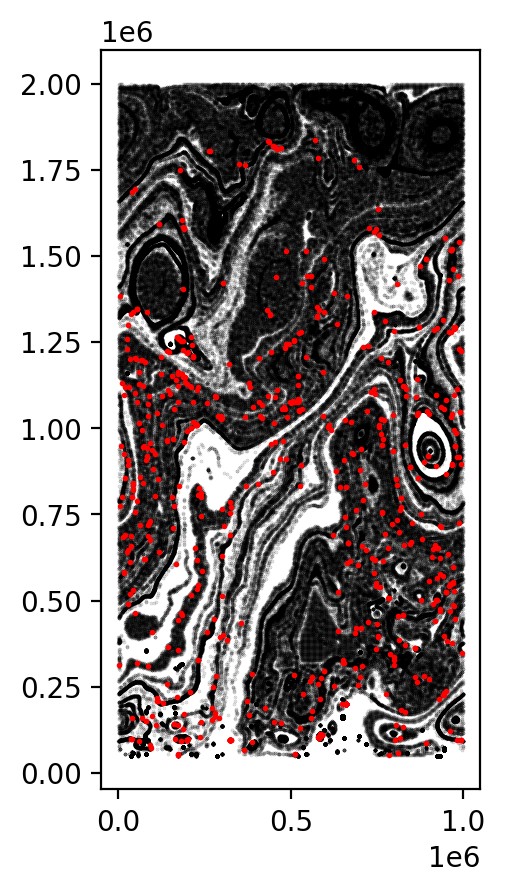

In [ ]:
plt.scatter(res['RK4_2D_static_dt10_forward_from_backw_from_t0'].isel(obs=-1).X % 1_000_000, res['RK4_2D_static_dt10_forward_from_backw_from_t0'].isel(obs=-1).Y, c='black', s=0.1, alpha=0.2)
plt.scatter(res['RK4_2D_static_dt10_forward_from_backw_from_t0'].isel(obs=-1).X[peak_mask] % 1_000_000, res['RK4_2D_static_dt10_forward_from_backw_from_t0'].isel(obs=-1).Y[peak_mask], c='red', s=1)

plt.gca().set_aspect(1)

In [ ]:
cluster_mask = ((res['RK4_2D_static_dt10_forward_from_backw_from_t0'].isel(obs=-1).X > 659_000) &
                (res['RK4_2D_static_dt10_forward_from_backw_from_t0'].isel(obs=-1).X < 663_000) &
                (res['RK4_2D_static_dt10_forward_from_backw_from_t0'].isel(obs=-1).Y > 198_000) &
                (res['RK4_2D_static_dt10_forward_from_backw_from_t0'].isel(obs=-1).Y < 202_000)
                )

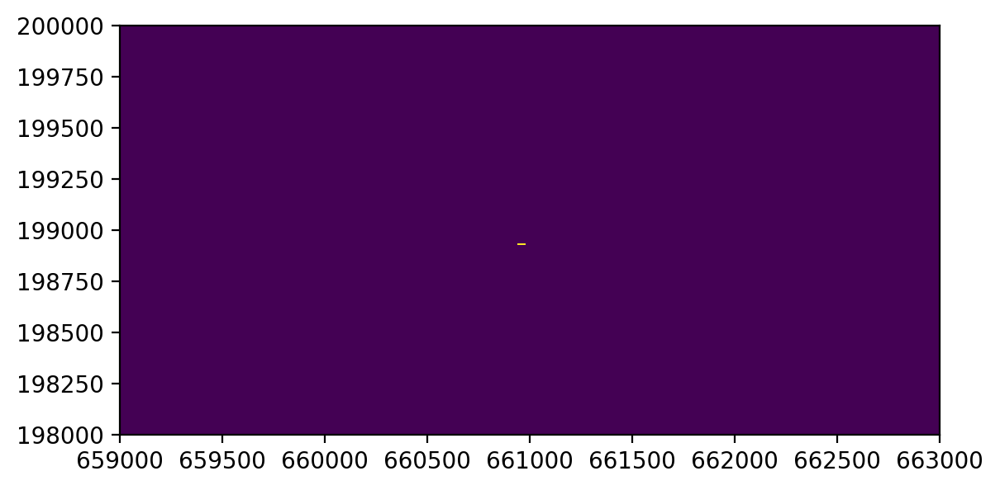

In [ ]:
plt.hist2d(x = res['RK4_2D_static_dt10_forward_from_backw_from_t0'].isel(obs=-1).X[peak_mask] % 1_000_000, 
           y = res['RK4_2D_static_dt10_forward_from_backw_from_t0'].isel(obs=-1).Y[peak_mask],
           bins=[np.linspace(659_000, 663_000, 100), np.linspace(198_000, 200_000, 200)])
plt.gca().set_aspect(1)
plt.show()

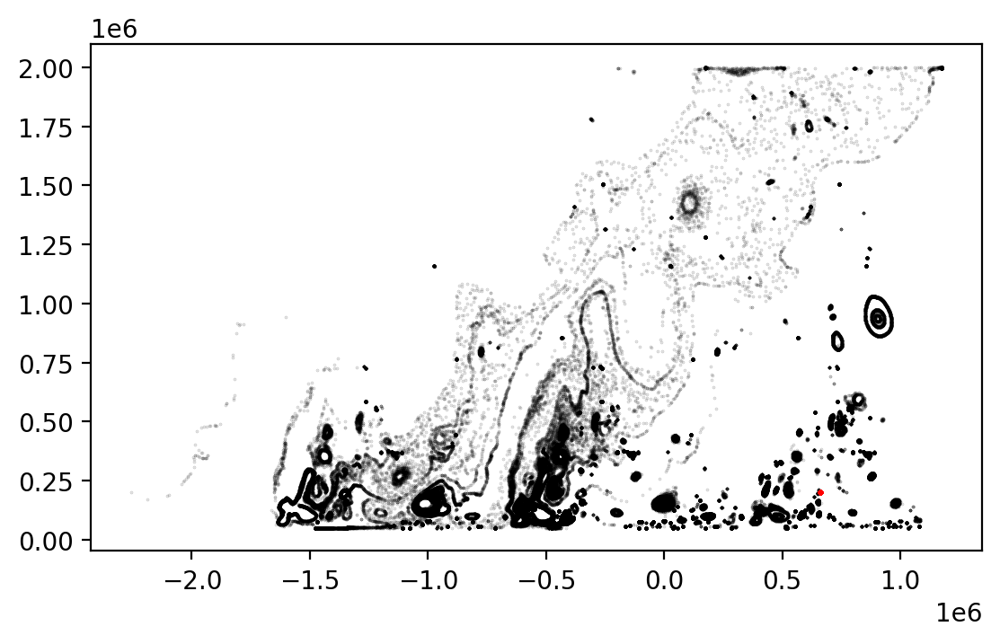

In [ ]:
plt.scatter(res['RK4_2D_static_dt10_forward_from_backw_from_t0'].isel(obs=0).X, res['RK4_2D_static_dt10_forward_from_backw_from_t0'].isel(obs=0).Y, c='black', s=0.1, alpha=0.2)
plt.scatter(res['RK4_2D_static_dt10_forward_from_backw_from_t0'].isel(obs=0).X[peak_mask * cluster_mask], res['RK4_2D_static_dt10_forward_from_backw_from_t0'].isel(obs=0).Y[peak_mask * cluster_mask], c='red', s=1)
plt.gca().set_aspect(1)

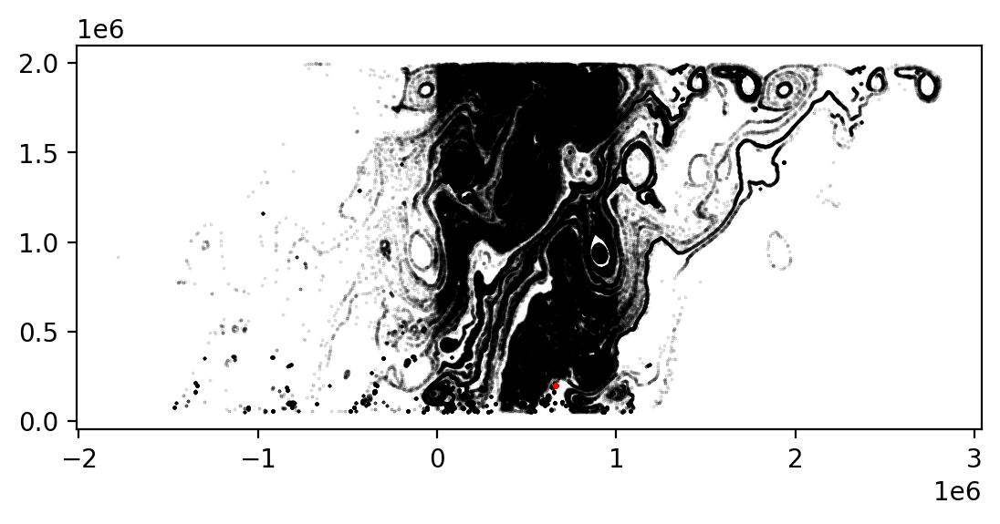

In [ ]:
plt.scatter(res['RK4_2D_static_dt10_forward_from_backw_from_t0'].isel(obs=-1).X, res['RK4_2D_static_dt10_forward_from_backw_from_t0'].isel(obs=-1).Y, c='black', s=0.1, alpha=0.2)
plt.scatter(res['RK4_2D_static_dt10_forward_from_backw_from_t0'].isel(obs=-1).X[peak_mask * cluster_mask], res['RK4_2D_static_dt10_forward_from_backw_from_t0'].isel(obs=-1).Y[peak_mask * cluster_mask], c='red', s=1)
plt.gca().set_aspect(1)

So one cluster of particles was causing the peak in large divergence.

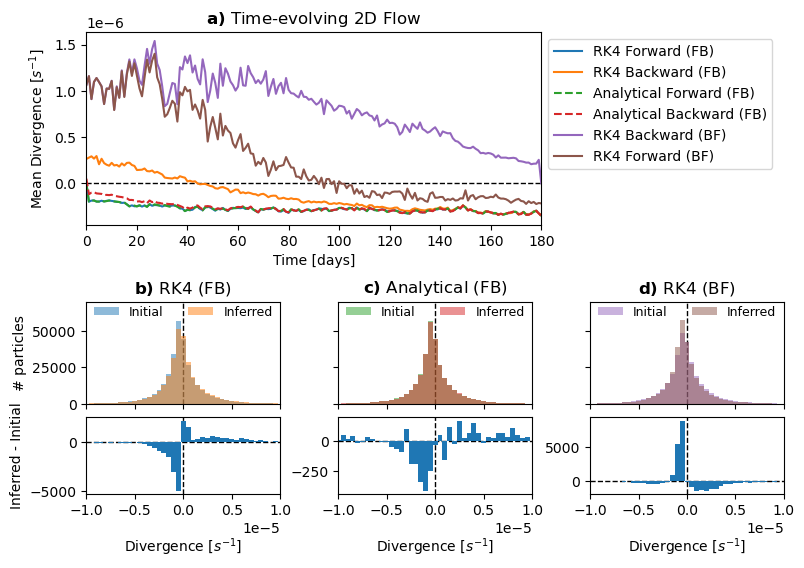

In [ ]:
fig = plt.figure(figsize=(9, 6))

gs_outer = fig.add_gridspec(2, 1, hspace=0.4, height_ratios=[1,1])
gs_top = gs_outer[0].subgridspec(1, 2, wspace=0, width_ratios=[3, 1.6])
gs_bottom = gs_outer[1].subgridspec(2, 3, wspace=0.3, hspace=0.15, width_ratios=[1, 1, 1], height_ratios=[2, 1.5])

# Top plot
ax_top = fig.add_subplot(gs_top[0])
res['RK4_2D_dyn_dt10_180d']['divergence'].mean('trajectory').plot(ax=ax_top, label="RK4 Forward (FB)")
res['RK4_2D_dyn_dt10_180d_backw']['divergence'].mean('trajectory')[::-1].plot(ax=ax_top, label="RK4 Backward (FB)")

res['anal_2D_dynamic']['divergence'].mean('trajectory').plot(ax=ax_top, label="Analytical Forward (FB)", linestyle='--')
res['anal_2D_dynamic_backw']['divergence'].mean('trajectory')[::-1].plot(ax=ax_top, label="Analytical Backward (FB)", linestyle='--')

res['RK4_2D_dyn_dt10_180d_backw_from_t0']['divergence'].mean('trajectory')[::-1].plot(ax=ax_top, label="RK4 Backward (BF)")
res['RK4_2D_dyn_dt10_forward_from_backw_from_t0']['divergence'].mean('trajectory').plot(ax=ax_top, label="RK4 Forward (BF)")

ax_top.set_xlabel('Time [days]')
ax_top.set_ylabel('Mean Divergence [$s^{-1}$]')

ax_top.legend(loc='upper left', bbox_to_anchor=(1, 1))
ax_top.axhline(0, color='black', linewidth=1, linestyle='--', zorder=0)
ax_top.set_xlim(0, 180)

# ax_top.text(0.025, 1.25, "a)", transform=ax_top.transAxes, fontsize=11, color='black', fontweight='bold', va='top')
ax_top.set_title(r"$\bf{a)}$ Time-evolving 2D Flow")

ax_tr_pad = fig.add_subplot(gs_top[1])
ax_tr_pad.axis('off')

# Bottom plot
def div_hist(expname, corrquant, bins=np.arange(-1e-5, 1e-5, 5e-7)):
    if type(expname) == str:
        expname_forward = expname
        expname_backward = expname + "_backw"
    elif type(expname) == tuple:
        expname_forward = expname[0]
        expname_backward = expname[1]
    else:
        raise ValueError("expname must be a string or a tuple of strings")

    mask = np.isfinite(res[expname_forward].isel(obs=-1).X)

    init_div = corrquant.interp(XC = res[expname_forward].isel(obs=0).X[mask] % 1_000_000, YC = res[expname_forward].isel(obs=0).Y[mask])
    reverse_div = corrquant.interp(XC = res[expname_backward].isel(obs=-1).X[mask]% 1_000_000, YC = res[expname_backward].isel(obs=-1).Y[mask])

    hist_2d_init, bins = np.histogram(init_div, bins=bins, density=False)
    hist_2d_reverse, bins = np.histogram(reverse_div, bins=bins, density=False)
    return hist_2d_init, hist_2d_reverse

# bins = np.arange(-1e-5, 1e-5, 5e-7)
bins = np.arange(-1e-5 - 2.5e-7, 1e-5 + 2.5e-7, 5e-7)
binwidth = bins[1] - bins[0]

hist_2d_fb_rk4_stat_init, hist_2d_fb_rk4_stat_reverse = div_hist('RK4_2D_dyn_dt10_180d', surface_divergence.isel(time=0))
hist_2d_fb_anal_stat_init, hist_2d_fb_anal_stat_reverse = div_hist('anal_2D_dynamic', surface_divergence.isel(time=0))
hist_2d_bf_rk4_stat_init, hist_2d_bf_rk4_stat_reverse = div_hist(('RK4_2D_dyn_dt10_180d_backw_from_t0', 'RK4_2D_dyn_dt10_forward_from_backw_from_t0') , surface_divergence.isel(time=-1))

histogram_data = [
    (hist_2d_fb_rk4_stat_init, hist_2d_fb_rk4_stat_reverse, r"$\bf{b)}$ RK4 (FB)"),
    (hist_2d_fb_anal_stat_init, hist_2d_fb_anal_stat_reverse, r"$\bf{c)}$ Analytical (FB)"),
    (hist_2d_bf_rk4_stat_init, hist_2d_bf_rk4_stat_reverse, r"$\bf{d)}$ RK4 (BF)")
]

hist_colors = [['C0', 'C1'], ['C2', 'C3'], ['C4', 'C5']]

for i, (hist_fw, hist_bw, title) in enumerate(histogram_data):
    ax = fig.add_subplot(gs_bottom[0, i]) 
    ax.bar(bins[:-1], hist_fw, width=binwidth, alpha=0.5, label='Initial', align='edge', color=hist_colors[i][0])
    ax.bar(bins[:-1], hist_bw, width=binwidth, alpha=0.5, label='Inferred', align='edge', color=hist_colors[i][1])
    ax.set_title(title)
    ax.axvline(0, color='black', linewidth=1, linestyle='--', zorder=0)
    ax.set_xlim(-1e-5, 1e-5)
    ax.set_xticks([-1e-5, -5e-6, 0, 5e-6, 1e-5])
    ax.set_xticklabels([])
    ax.set_ylim(0, 70000)
    if i == 0:
        ax.set_ylabel("# particles")
    else:
        ax.set_yticklabels([])
    ax.legend(loc='center', bbox_to_anchor=(0.5, 0.9), ncols=2, fontsize=9, framealpha=0.3, frameon=False)
    
    ax = fig.add_subplot(gs_bottom[1, i])
    ax.bar(bins[:-1], hist_bw-hist_fw, width=binwidth, align='edge')
    ax.set_xlim(-1e-5, 1e-5)
    ax.axhline(0, color='black', linewidth=1, linestyle='--', zorder=0)
    ax.axvline(0, color='black', linewidth=1, linestyle='--', zorder=0)
    # ax.set_ylim(-62500, 62500)
    if i == 0:
        ax.set_ylabel("Inferred - Initial")
    ax.set_xlabel("Divergence [$s^{-1}$]")
    ax.set_xticks([-1e-5, -5e-6, 0, 5e-6, 1e-5])
    # place the x-axis label slightly below the plot
    ax.xaxis.set_label_coords(0.5, -0.55)

plt.savefig("figures/divergence_comparison_2D_dynamic_w_hist.pdf", bbox_inches='tight')
plt.show()

In [ ]:
def plot_histogram_correlation(expname, corrquant, corr_quant_name, bins, title=None, save=False, reverse=True):
    if type(expname) == str:
        expname_forward = expname
        expname_backward = expname + "_backw"
    elif type(expname) == tuple:
        expname_forward = expname[0]
        expname_backward = expname[1]
    else:
        raise ValueError("expname must be a string or a tuple of strings")

    mask = np.isfinite(res[expname_forward].isel(obs=-1).X)

    init_div = corrquant.interp(XC = res[expname_forward].isel(obs=0).X[mask] % 1_000_000, YC = res[expname_forward].isel(obs=0).Y[mask])
    backw_div = corrquant.interp(XC = res[expname_backward].isel(obs=-1).X[mask]% 1_000_000, YC = res[expname_backward].isel(obs=-1).Y[mask])

    binwidth = bins[1] - bins[0]
    fig, ax = plt.subplots(nrows=2, figsize=(4,3.5), height_ratios=(1.6, 1))

    hist_2d_forward, bins = np.histogram(init_div, bins=bins, density=False)
    hist_2d_backward, bins = np.histogram(backw_div, bins=bins, density=False)

    if reverse:
        ax[0].bar(bins[:-1], hist_2d_forward, width=binwidth, alpha=0.5, label='Backward', align='edge')
        ax[0].bar(bins[:-1], hist_2d_backward, width=binwidth, alpha=0.5, label='Forward', align='edge')
    else:
        ax[0].bar(bins[:-1], hist_2d_forward, width=binwidth, alpha=0.5, label='Forward', align='edge')
        ax[0].bar(bins[:-1], hist_2d_backward, width=binwidth, alpha=0.5, label='Backward', align='edge')
    ax[0].legend()
    ax[0].set_ylabel("# particles")

    if reverse:
        ax[1].bar(bins[:-1], hist_2d_backward-hist_2d_forward, width=binwidth, align='edge')
        ax[1].set_ylabel("Backward - Forward")
    else:
        ax[1].bar(bins[:-1], hist_2d_forward-hist_2d_backward, width=binwidth, align='edge')
        ax[1].set_ylabel("Forward - Backward")

    ax[1].set_xlabel(corr_quant_name)
    if title is not None:
        ax[0].set_title(title)
    else:
        ax[0].set_title(expname_forward)
    
    if save:
        plt.savefig(f"figures/divergence_histograms/divergence_histogram_{expname_forward}_{corr_quant_name}.pdf", bbox_inches='tight')

    plt.show()
